# Wasserstein GAN with Gradient Penalty (WGAN-GP)

### Goals
In this notebook, you're going to build a Wasserstein GAN with Gradient Penalty (WGAN-GP) that solves some of the stability issues with the GANs that you have been using up until this point. Specifically, you'll use a special kind of loss function known as the W-loss, where W stands for Wasserstein, and gradient penalties to prevent mode collapse.

*Fun Fact: Wasserstein is named after a mathematician at Penn State, Leonid Vaseršteĭn. You'll see it abbreviated to W (e.g. WGAN, W-loss, W-distance).*

### Learning Objectives
1.   Get hands-on experience building a more stable GAN: Wasserstein GAN with Gradient Penalty (WGAN-GP).
2.   Train the more advanced WGAN-GP model.



## Generator and Critic

You will begin by importing some useful packages, defining visualization functions, building the generator, and building the critic. Since the changes for WGAN-GP are done to the loss function during training, you can simply reuse your previous GAN code for the generator and critic class. Remember that in WGAN-GP, you no longer use a discriminator that classifies fake and real as 0 and 1 but rather a critic that scores images with real numbers.

#### Packages and Visualizations

In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.
    '''
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

def make_grad_hook():
    '''
    Function to keep track of gradients for visualization purposes, 
    which fills the grads list when using model.apply(grad_hook).
    '''
    grads = []
    def grad_hook(m):
        if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
            grads.append(m.weight.grad)
    return grads, grad_hook

#### Generator and Noise

In [2]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_chan=1, hidden_dim=64):
        super(Generator, self).__init__()
        self.z_dim = z_dim
        # Build the neural network
        self.gen = nn.Sequential(
            self.make_gen_block(z_dim, hidden_dim * 4),
            self.make_gen_block(hidden_dim * 4, hidden_dim * 2, kernel_size=4, stride=1),
            self.make_gen_block(hidden_dim * 2, hidden_dim),
            self.make_gen_block(hidden_dim, im_chan, kernel_size=4, final_layer=True),
        )

    def make_gen_block(self, input_channels, output_channels, kernel_size=3, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a generator block of DCGAN;
        a transposed convolution, a batchnorm (except in the final layer), and an activation.
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.ReLU(inplace=True),
            )
        else:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.Tanh(),
            )

    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor,
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        x = noise.view(len(noise), self.z_dim, 1, 1)
        return self.gen(x)

def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim)
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
      n_samples: the number of samples to generate, a scalar
      z_dim: the dimension of the noise vector, a scalar
      device: the device type
    '''
    return torch.randn(n_samples, z_dim, device=device)

#### Critic

In [3]:
class Critic(nn.Module):
    '''
    Critic Class
    Values:
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_chan=1, hidden_dim=64):
        super(Critic, self).__init__()
        self.crit = nn.Sequential(
            self.make_crit_block(im_chan, hidden_dim),
            self.make_crit_block(hidden_dim, hidden_dim * 2),
            self.make_crit_block(hidden_dim * 2, 1, final_layer=True),
        )

    def make_crit_block(self, input_channels, output_channels, kernel_size=4, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a critic block of DCGAN;
        a convolution, a batchnorm (except in the final layer), and an activation (except in the final layer).
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.LeakyReLU(0.2, inplace=True),
            )
        else:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
            )

    def forward(self, image):
        '''
        Function for completing a forward pass of the critic: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_chan)
        '''
        crit_pred = self.crit(image)
        return crit_pred.view(len(crit_pred), -1)

## Training Initializations
Now you can start putting it all together.
As usual, you will start by setting the parameters:
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   beta_1, beta_2: the momentum terms
  *   c_lambda: weight of the gradient penalty
  *   crit_repeats: number of times to update the critic per generator update - there are more details about this in the *Putting It All Together* section
  *   device: the device type

You will also load and transform the MNIST dataset to tensors.




In [4]:
n_epochs = 100
z_dim = 64
display_step = 50
batch_size = 128
lr = 0.0002
beta_1 = 0.5
beta_2 = 0.999
c_lambda = 10
crit_repeats = 5
device = 'cuda'

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),
])

dataloader = DataLoader(
    MNIST('.', download=False, transform=transform),
    batch_size=batch_size,
    shuffle=True)

Then, you can initialize your generator, critic, and optimizers.

In [5]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr, betas=(beta_1, beta_2))
crit = Critic().to(device) 
crit_opt = torch.optim.Adam(crit.parameters(), lr=lr, betas=(beta_1, beta_2))

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)
gen = gen.apply(weights_init)
crit = crit.apply(weights_init)


## Gradient Penalty
Calculating the gradient penalty can be broken into two functions: (1) compute the gradient with respect to the images and (2) compute the gradient penalty given the gradient.

You can start by getting the gradient. The gradient is computed by first creating a mixed image. This is done by weighing the fake and real image using epsilon and then adding them together. Once you have the intermediate image, you can get the critic's output on the image. Finally, you compute the gradient of the critic score's on the mixed images (output) with respect to the pixels of the mixed images (input). You will need to fill in the code to get the gradient wherever you see *None*. There is a test function in the next block for you to test your solution.

In [6]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gradient
def get_gradient(crit, real, fake, epsilon):
    '''
    Return the gradient of the critic's scores with respect to mixes of real and fake images.
    Parameters:
        crit: the critic model
        real: a batch of real images
        fake: a batch of fake images
        epsilon: a vector of the uniformly random proportions of real/fake per mixed image
    Returns:
        gradient: the gradient of the critic's scores, with respect to the mixed image
    '''
    # Mix the images together
    mixed_images = real * epsilon + fake * (1 - epsilon)

    # Calculate the critic's scores on the mixed images
    mixed_scores = crit(mixed_images)
    
    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        # Note: You need to take the gradient of outputs with respect to inputs.
        # This documentation may be useful, but it should not be necessary:
        # https://pytorch.org/docs/stable/autograd.html#torch.autograd.grad
        #### START CODE HERE ####
        inputs=mixed_images,
        outputs=mixed_scores,
        #### END CODE HERE ####
        # These other parameters have to do with the pytorch autograd engine works
        grad_outputs=torch.ones_like(mixed_scores), 
        create_graph=True,
        retain_graph=True,
    )[0]
    return gradient


In [7]:
# UNIT TEST
# DO NOT MODIFY THIS
def test_get_gradient(image_shape):
    real = torch.randn(*image_shape, device=device) + 1
    fake = torch.randn(*image_shape, device=device) - 1
    epsilon_shape = [1 for _ in image_shape]
    epsilon_shape[0] = image_shape[0]
    epsilon = torch.rand(epsilon_shape, device=device).requires_grad_()
    gradient = get_gradient(crit, real, fake, epsilon)
    assert tuple(gradient.shape) == image_shape
    assert gradient.max() > 0
    assert gradient.min() < 0
    return gradient

gradient = test_get_gradient((256, 1, 28, 28))
print("Success!")

Success!


The second function you need to complete is to compute the gradient penalty given the gradient. First, you calculate the magnitude of each image's gradient. The magnitude of a gradient is also called the norm. Then, you calculate the penalty by squaring the distance between each magnitude and the ideal norm of 1 and taking the mean of all the squared distances.

Again, you will need to fill in the code wherever you see *None*. There are hints below that you can view if you need help and there is a test function in the next block for you to test your solution.

<details>

<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">gradient_penalty</font></code></b>
</font>
</summary>


1.   Make sure you take the mean at the end.
2.   Note that the magnitude of each gradient has already been calculated for you.

</details>


In [8]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: gradient_penalty
def gradient_penalty(gradient):
    '''
    Return the gradient penalty, given a gradient.
    Given a batch of image gradients, you calculate the magnitude of each image's gradient
    and penalize the mean quadratic distance of each magnitude to 1.
    Parameters:
        gradient: the gradient of the critic's scores, with respect to the mixed image
    Returns:
        penalty: the gradient penalty
    '''
    # Flatten the gradients so that each row captures one image
    gradient = gradient.view(len(gradient), -1)

    # Calculate the magnitude of every row
    gradient_norm = gradient.norm(2, dim=1)
    #print(type(gradient_norm))
    #print(gradient_norm[:4])
    #print((gradient_norm[:4]- torch.ones_like(gradient_norm[:4]))**2)
    #print(gradient_norm.shape)
    # Penalize the mean squared distance of the gradient norms from 1
    #### START CODE HERE ####
    penalty = torch.mean((gradient_norm - torch.ones_like(gradient_norm))**2)
    #### END CODE HERE ####
    return penalty

In [9]:
# UNIT TEST
def test_gradient_penalty(image_shape):
    bad_gradient = torch.zeros(*image_shape)
    bad_gradient_penalty = gradient_penalty(bad_gradient)
    assert torch.isclose(bad_gradient_penalty, torch.tensor(1.))

    image_size = torch.prod(torch.Tensor(image_shape[1:]))
    good_gradient = torch.ones(*image_shape) / torch.sqrt(image_size)
    good_gradient_penalty = gradient_penalty(good_gradient)
    assert torch.isclose(good_gradient_penalty, torch.tensor(0.))

    random_gradient = test_get_gradient(image_shape)
    random_gradient_penalty = gradient_penalty(random_gradient)
    assert torch.abs(random_gradient_penalty - 1) < 0.1

test_gradient_penalty((256, 1, 28, 28))
print("Success!")

Success!


## Losses
Next, you need to calculate the loss for the generator and the critic.

For the generator, the loss is calculated by maximizing the critic's prediction on the generator's fake images. The argument has the scores for all fake images in the batch, but you will use the mean of them.

There are optional hints below and a test function in the next block for you to test your solution.

<details><summary><font size="3" color="green"><b>Optional hints for <code><font size="4">get_gen_loss</font></code></b></font></summary>

1. This can be written in one line.
2. This is the negative of the mean of the critic's scores.

</details>

In [10]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gen_loss
def get_gen_loss(crit_fake_pred):
    '''
    Return the loss of a generator given the critic's scores of the generator's fake images.
    Parameters:
        crit_fake_pred: the critic's scores of the fake images
    Returns:
        gen_loss: a scalar loss value for the current batch of the generator
    '''
    #### START CODE HERE ####
    gen_loss = -torch.mean(crit_fake_pred) 
    #### END CODE HERE ####
    return gen_loss

In [11]:
# UNIT TEST
assert torch.isclose(
    get_gen_loss(torch.tensor(1.)), torch.tensor(-1.0)
)

assert torch.isclose(
    get_gen_loss(torch.rand(10000)), torch.tensor(-0.5), 0.05
)

print("Success!")

Success!


For the critic, the loss is calculated by maximizing the distance between the critic's predictions on the real images and the predictions on the fake images while also adding a gradient penalty. The gradient penalty is weighed according to lambda. The arguments are the scores for all the images in the batch, and you will use the mean of them.

There are hints below if you get stuck and a test function in the next block for you to test your solution.

<details><summary><font size="3" color="green"><b>Optional hints for <code><font size="4">get_crit_loss</font></code></b></font></summary>

1. The higher the mean fake score, the higher the critic's loss is.
2. What does this suggest about the mean real score?
3. The higher the gradient penalty, the higher the critic's loss is, proportional to lambda.


</details>


In [12]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_crit_loss
def get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda):
    '''
    Return the loss of a critic given the critic's scores for fake and real images,
    the gradient penalty, and gradient penalty weight.
    Parameters:
        crit_fake_pred: the critic's scores of the fake images
        crit_real_pred: the critic's scores of the real images
        gp: the unweighted gradient penalty
        c_lambda: the current weight of the gradient penalty 
    Returns:
        crit_loss: a scalar for the critic's loss, accounting for the relevant factors
    '''
    #### START CODE HERE ####
    crit_loss = -torch.mean(crit_real_pred) + torch.mean(crit_fake_pred)+gp * c_lambda
    #### END CODE HERE ####
    return crit_loss

In [13]:
# UNIT TEST
assert torch.isclose(
    get_crit_loss(torch.tensor(1.), torch.tensor(2.), torch.tensor(3.), 0.1),
    torch.tensor(-0.7)
)
assert torch.isclose(
    get_crit_loss(torch.tensor(20.), torch.tensor(-20.), torch.tensor(2.), 10),
    torch.tensor(60.)
)

print("Success!")

Success!


## Putting It All Together
Before you put everything together, there are a few things to note.
1.   Even on GPU, the **training will run more slowly** than previous labs because the gradient penalty requires you to compute the gradient of a gradient -- this means potentially a few minutes per epoch! For best results, run this for as long as you can while on GPU.
2.   One important difference from earlier versions is that you will **update the critic multiple times** every time you update the generator This helps prevent the generator from overpowering the critic. Sometimes, you might see the reverse, with the generator updated more times than the critic. This depends on architectural (e.g. the depth and width of the network) and algorithmic choices (e.g. which loss you're using). 
3.   WGAN-GP isn't necessarily meant to improve overall performance of a GAN, but just **increases stability** and avoids mode collapse. In general, a WGAN will be able to train in a much more stable way than the vanilla DCGAN from last assignment, though it will generally run a bit slower. You should also be able to train your model for more epochs without it collapsing.


<!-- Once again, be warned that this runs very slowly on a CPU. One way to run this more quickly is to download the .ipynb and upload it to Google Drive, then open it with Google Colab and make the runtime type GPU and replace
`device = "cpu"`
with
`device = "cuda"`
and make sure that your `get_noise` function uses the right device.  -->

Here is a snapshot of what your WGAN-GP outputs should resemble:
![MNIST Digits Progression](MNIST_WGAN_Progression.png)

Step 50: Generator loss: -0.09149172723293304, critic loss: 1.8956799867749219


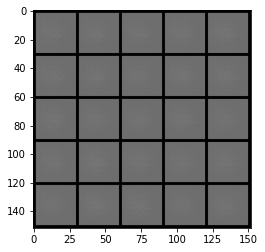

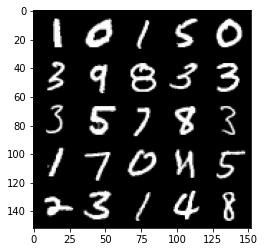

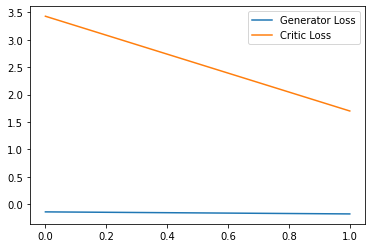

Step 100: Generator loss: 0.8924281462281942, critic loss: -1.8482002914845943


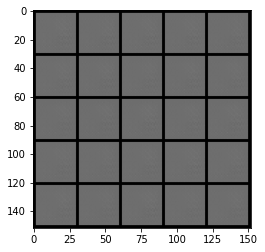

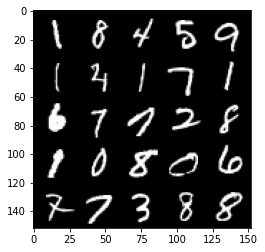

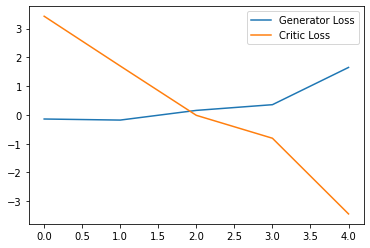

Step 150: Generator loss: 2.5874859499931335, critic loss: -11.081032875061034


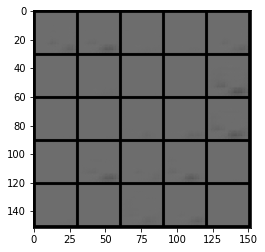

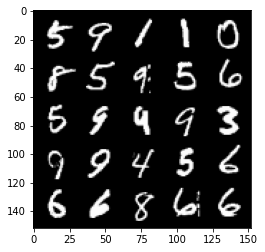

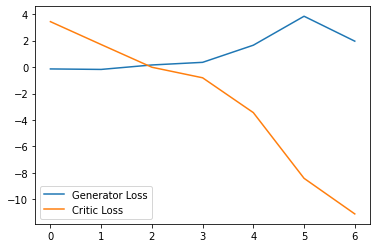

Step 200: Generator loss: 0.8267986486852169, critic loss: -28.179666542053223


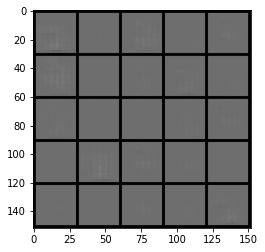

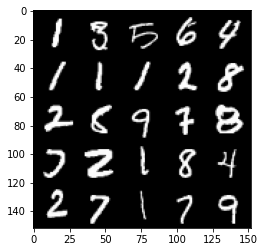

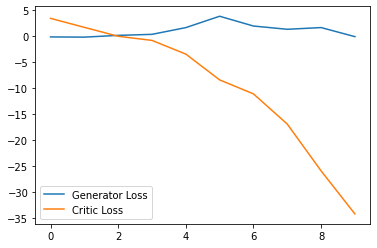

Step 250: Generator loss: -0.9711639067530632, critic loss: -55.716857421874984


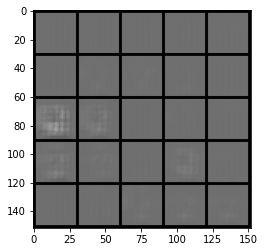

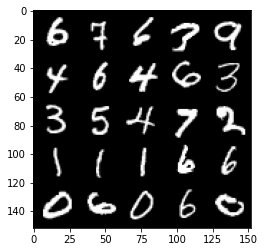

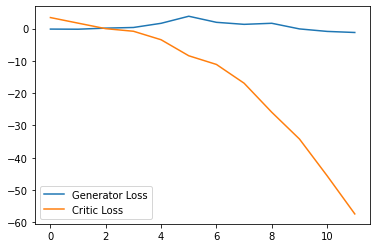

Step 300: Generator loss: -1.2169717967510223, critic loss: -91.86453042602542


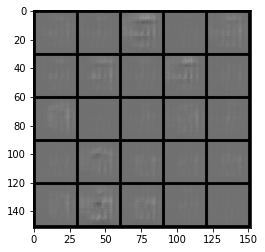

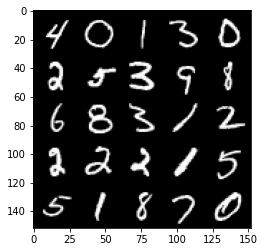

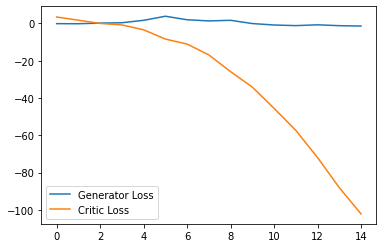

Step 350: Generator loss: 1.0574776553362608, critic loss: -132.54719113159175


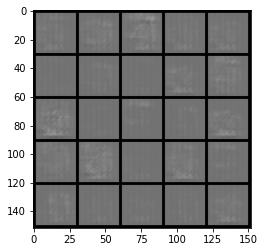

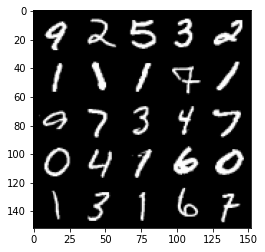

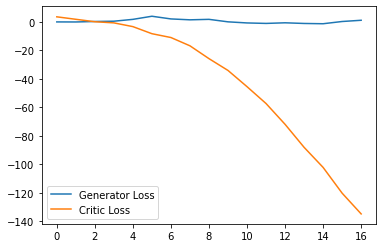

Step 400: Generator loss: 3.246766461133957, critic loss: -184.81660607910158


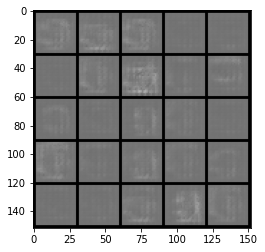

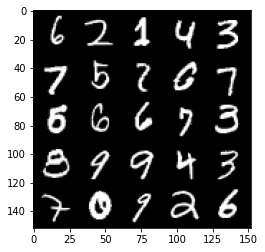

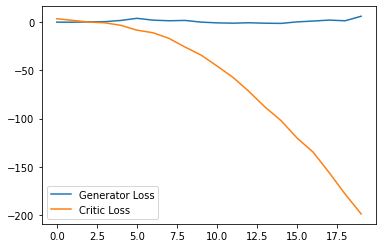

Step 450: Generator loss: 3.5662443113327025, critic loss: -236.48296368408202


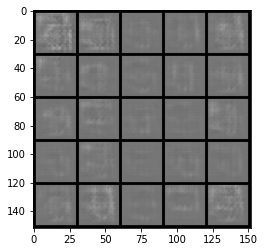

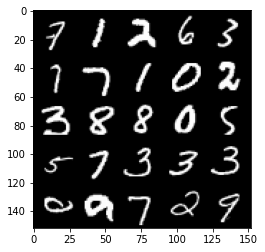

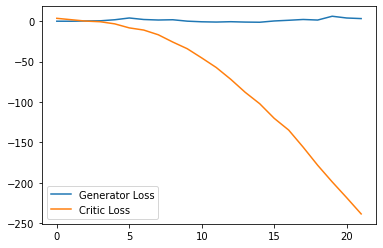

Step 500: Generator loss: 9.236625938415527, critic loss: -292.94370874023434


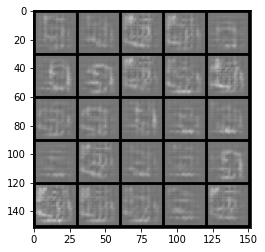

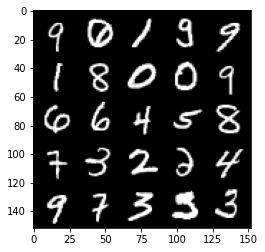

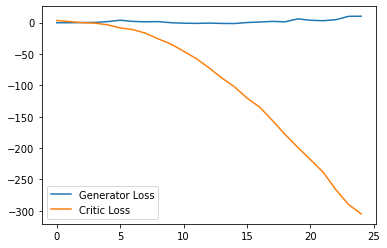

Step 550: Generator loss: -14.318842606544495, critic loss: -265.19733526611327


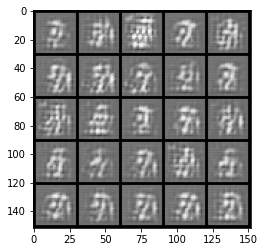

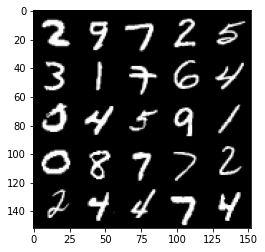

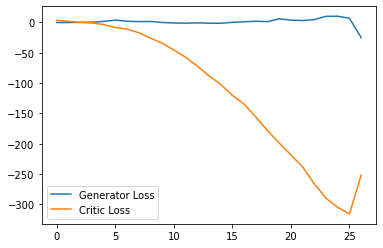

Step 600: Generator loss: 1.713794128894806, critic loss: -260.9376305541993


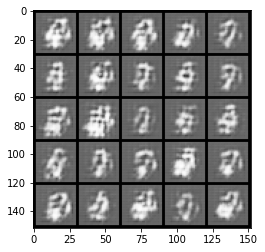

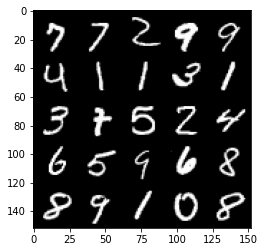

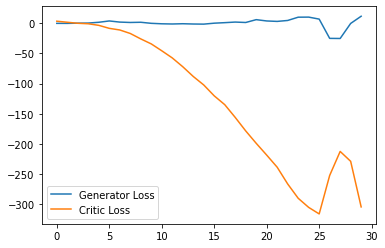

Step 650: Generator loss: 7.556220430135727, critic loss: -329.2087415466309


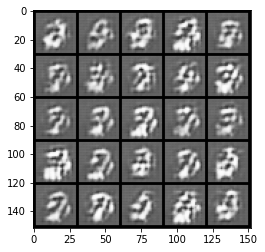

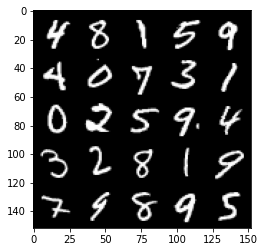

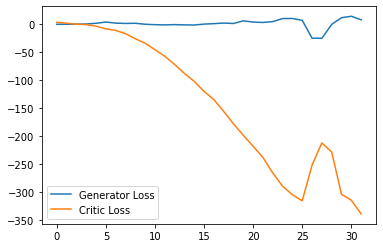

Step 700: Generator loss: -32.826251080036165, critic loss: -233.1586691589356


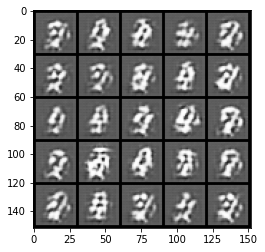

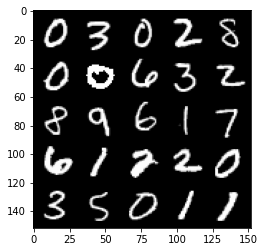

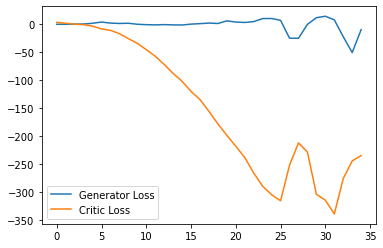

Step 750: Generator loss: -9.979680612683296, critic loss: -171.03568557739263


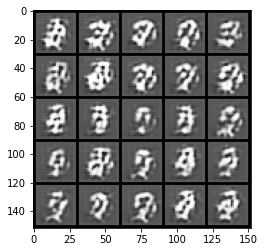

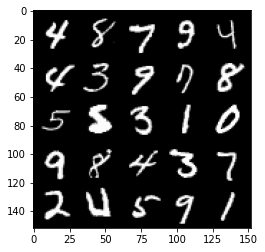

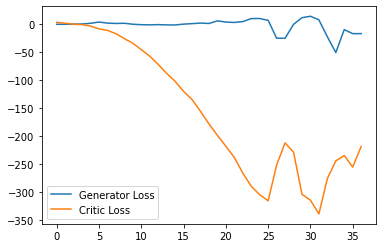

Step 800: Generator loss: -7.474686586856842, critic loss: 12.022424079895016


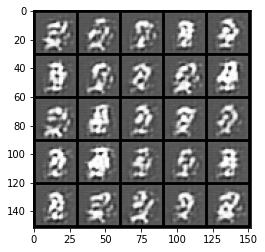

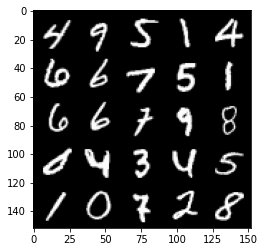

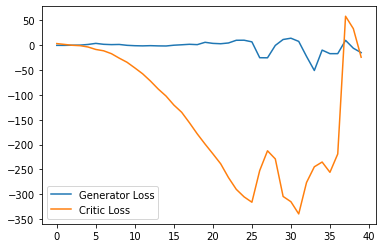

Step 850: Generator loss: -23.104677243828775, critic loss: -142.83405447387688


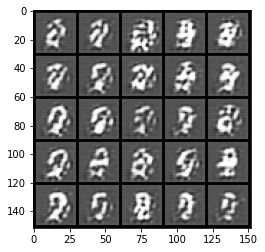

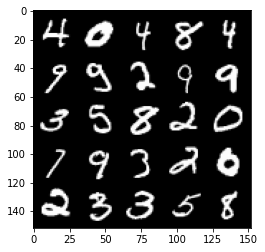

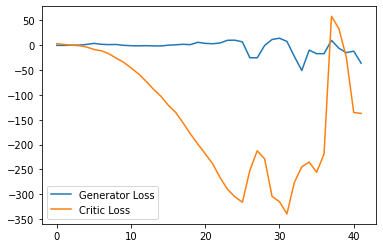

Step 900: Generator loss: -32.09340086519718, critic loss: -145.62849656677244


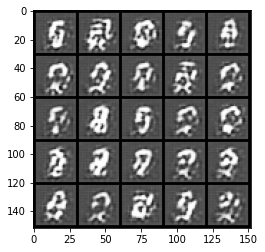

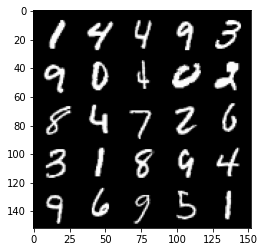

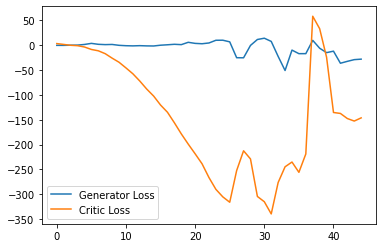

Step 950: Generator loss: -16.784557876586913, critic loss: -156.96226715087894


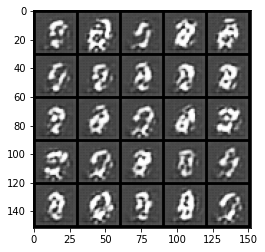

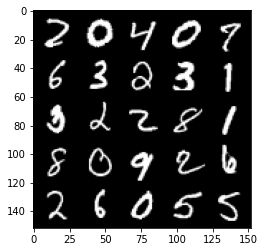

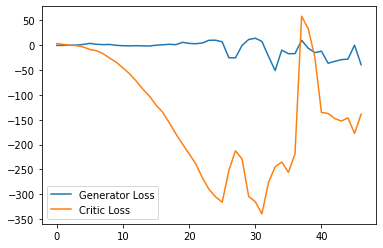

Step 1000: Generator loss: -13.285047359466553, critic loss: -128.97723503112792


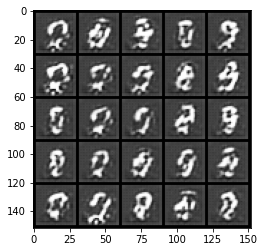

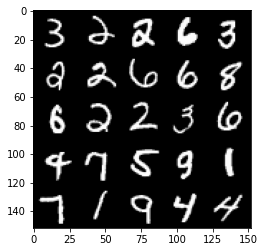

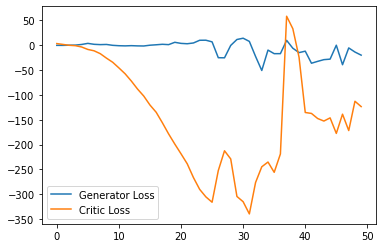

Step 1050: Generator loss: -16.478820112943648, critic loss: -138.4860380859375


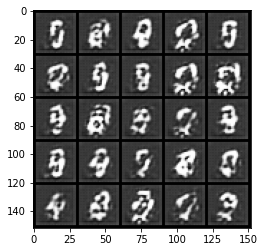

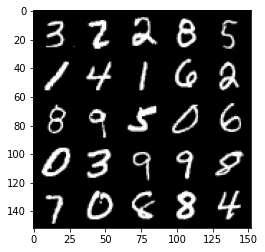

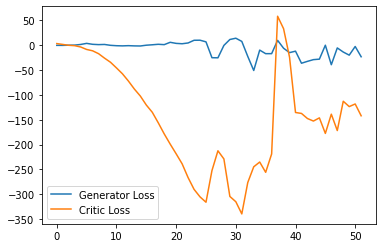

Step 1100: Generator loss: -6.281334853172302, critic loss: 5.37349862289429


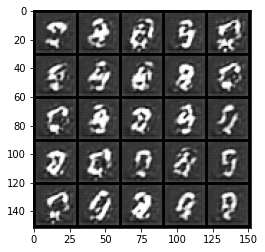

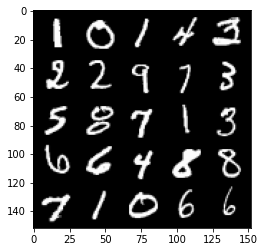

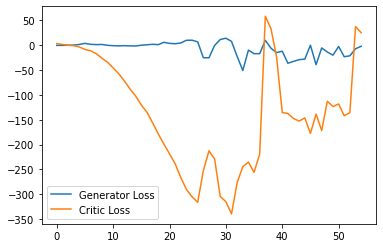

Step 1150: Generator loss: -1.2925305420160293, critic loss: 15.104494298934934


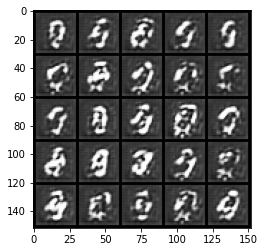

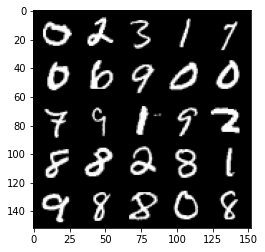

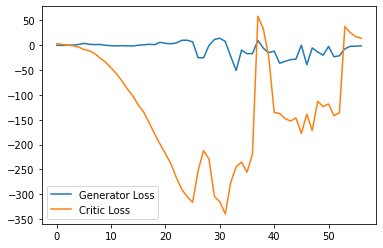

Step 1200: Generator loss: 0.5448829534649849, critic loss: 9.3798165512085


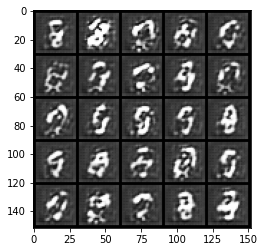

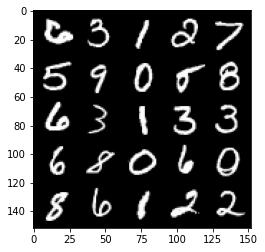

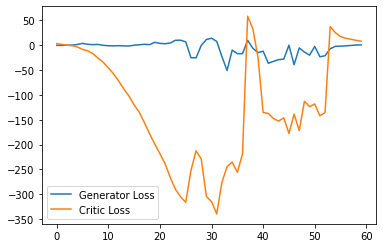

Step 1250: Generator loss: 1.0651972997188568, critic loss: 5.854626485824583


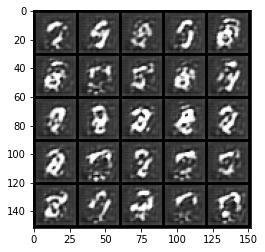

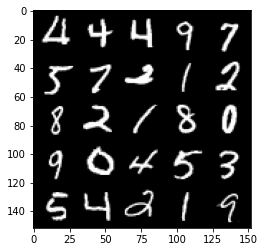

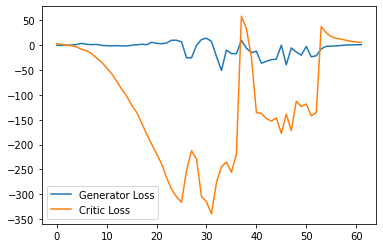

Step 1300: Generator loss: 1.7754865086078644, critic loss: 4.913649385452271


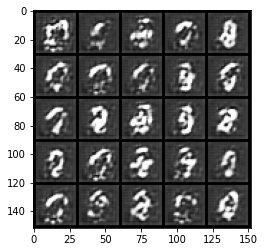

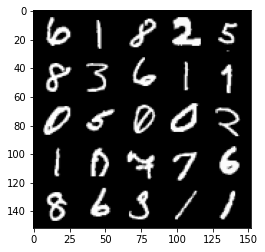

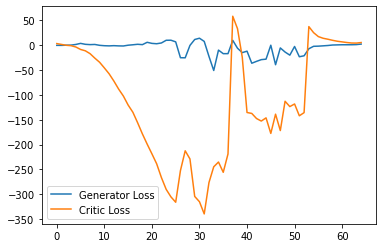

Step 1350: Generator loss: 4.295237894058228, critic loss: 18.920845212936396


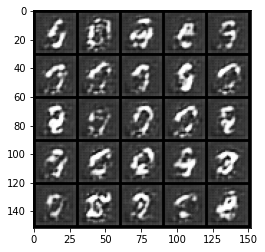

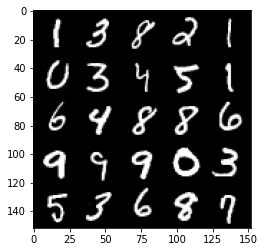

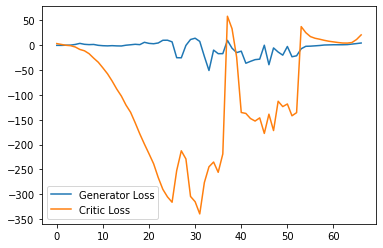

Step 1400: Generator loss: 6.339678478240967, critic loss: 29.33395877075194


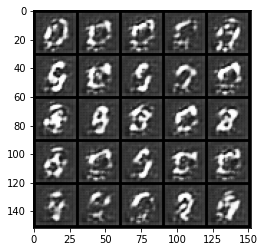

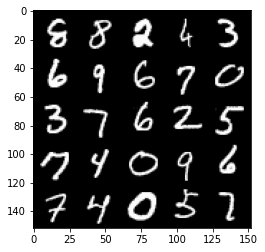

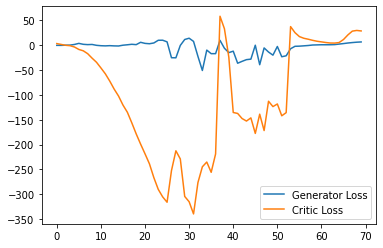

Step 1450: Generator loss: 7.585155916213989, critic loss: 23.032183605194092


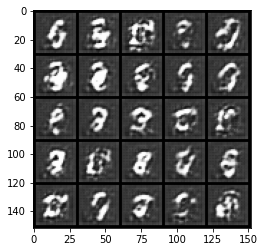

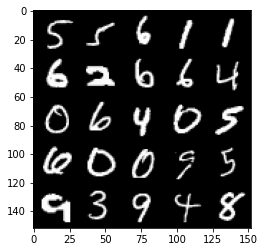

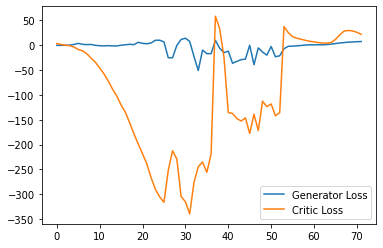

Step 1500: Generator loss: 10.008692436218261, critic loss: 15.83114692306519


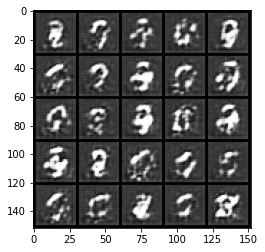

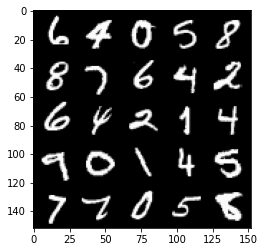

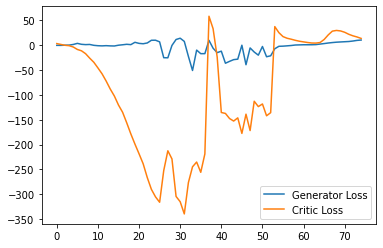

Step 1550: Generator loss: 12.396375427246094, critic loss: 11.511389102935789


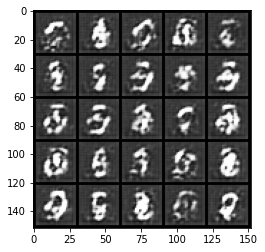

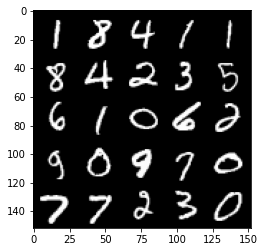

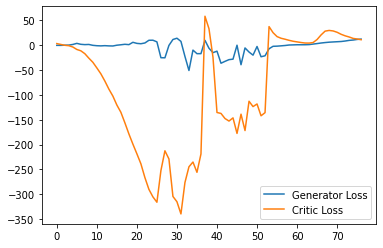

Step 1600: Generator loss: 14.134162521362304, critic loss: 7.7500830993652325


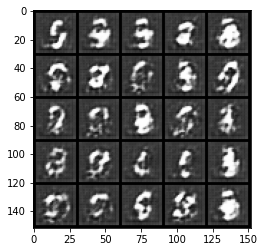

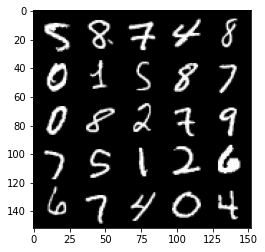

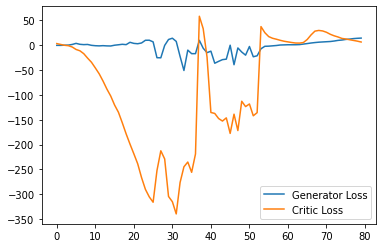

Step 1650: Generator loss: 14.932191123962403, critic loss: 3.8869341125488273


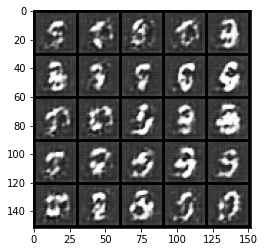

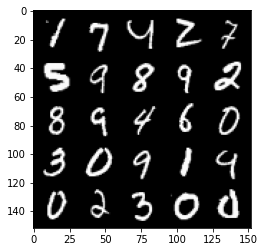

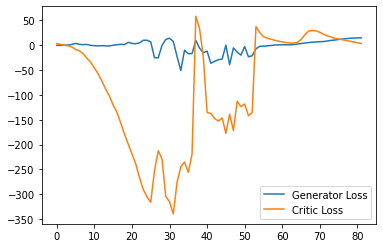

Step 1700: Generator loss: 14.77737859725952, critic loss: 1.008384006500244


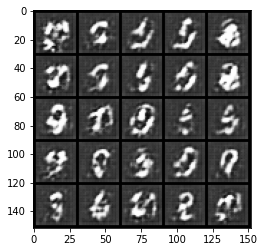

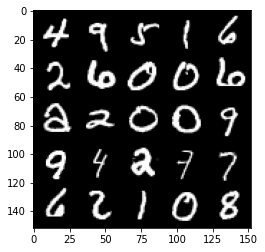

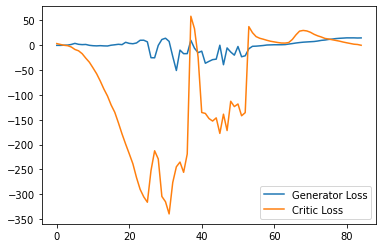

Step 1750: Generator loss: 14.394531593322753, critic loss: -2.5714610128402713


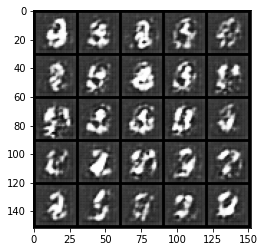

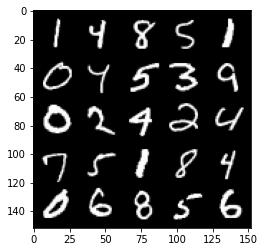

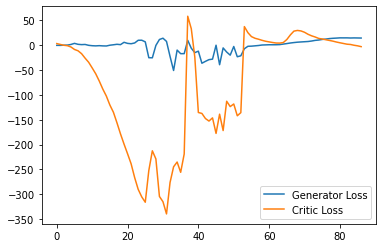

Step 1800: Generator loss: 14.959244709014893, critic loss: -10.565090860366823


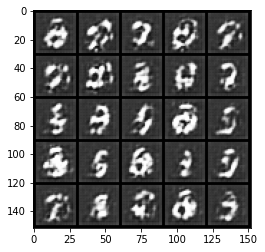

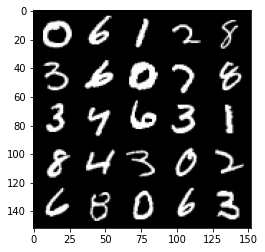

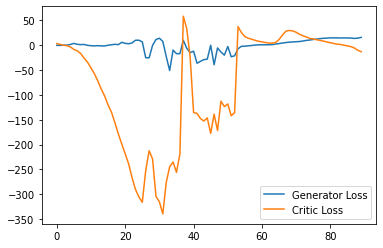

Step 1850: Generator loss: 15.614807653427125, critic loss: -18.508294441223146


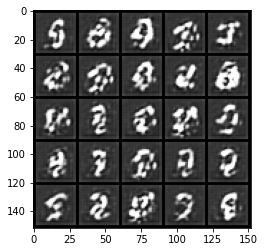

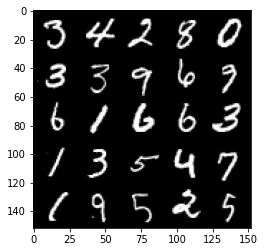

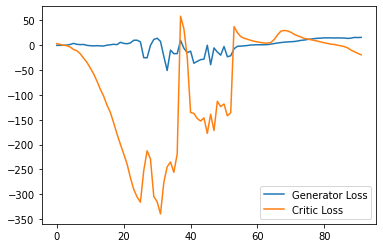

Step 1900: Generator loss: 16.82310755729675, critic loss: -22.16808964157104


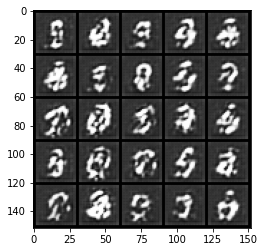

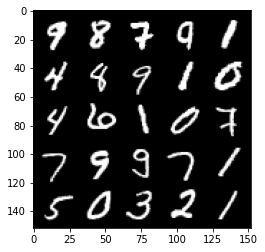

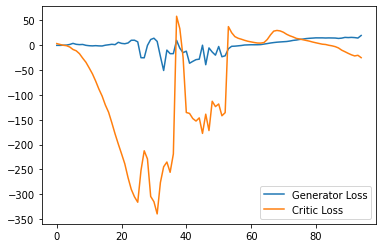

Step 1950: Generator loss: 18.85926197052002, critic loss: -27.144647586822508


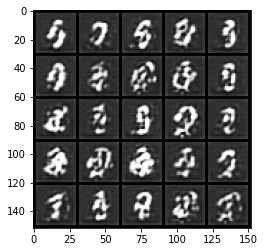

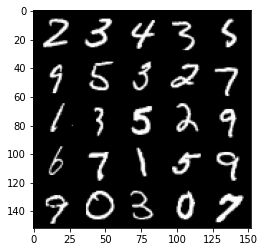

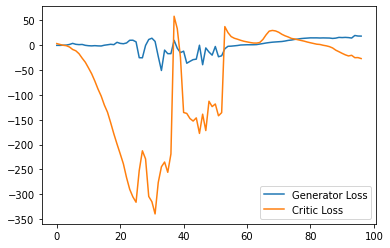

Step 2000: Generator loss: 21.464081649780272, critic loss: -19.091258832931523


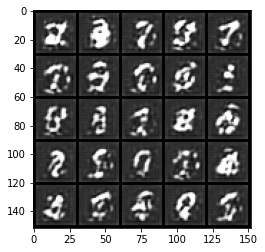

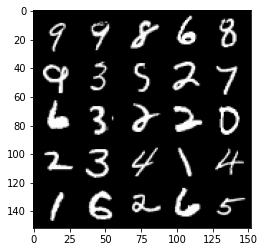

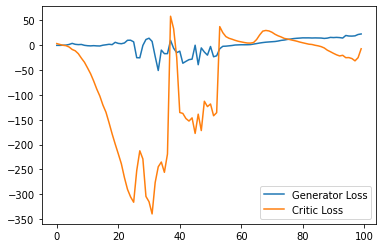

Step 2050: Generator loss: 19.222905428409575, critic loss: -26.37471021461487


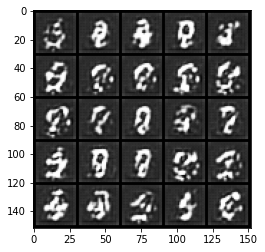

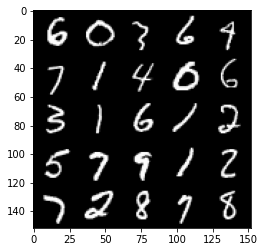

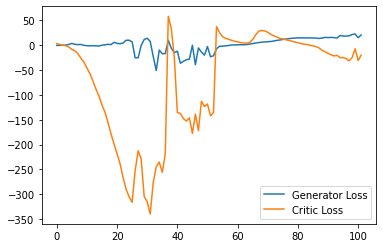

Step 2100: Generator loss: 19.160313532352447, critic loss: -25.79574489974976


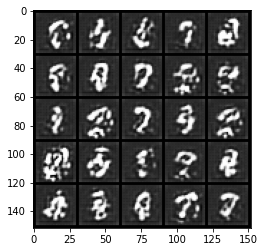

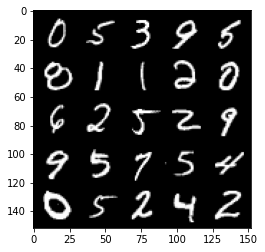

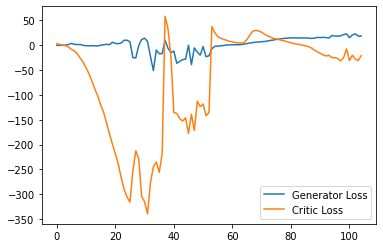

Step 2150: Generator loss: 20.67420835137367, critic loss: -29.058121608734133


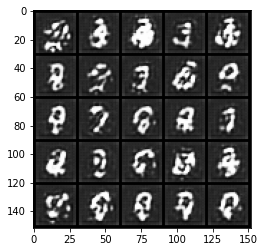

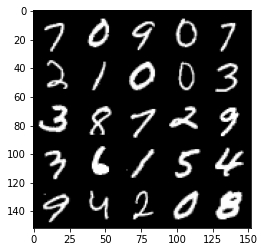

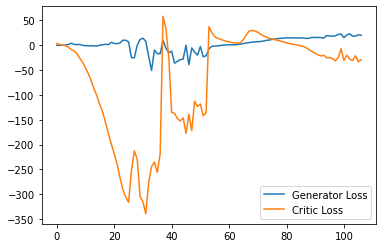

Step 2200: Generator loss: 21.870403757095335, critic loss: -23.49798877906799


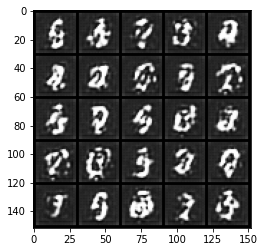

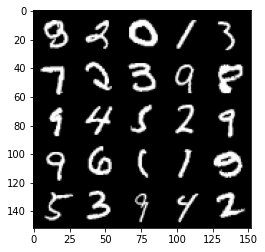

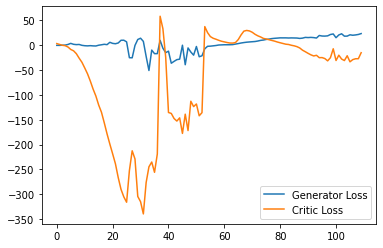

Step 2250: Generator loss: 20.51962438583374, critic loss: -27.473120035171497


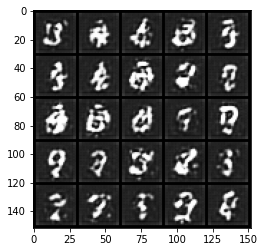

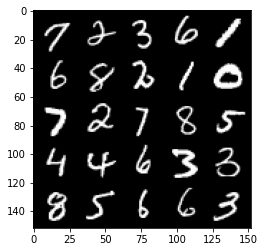

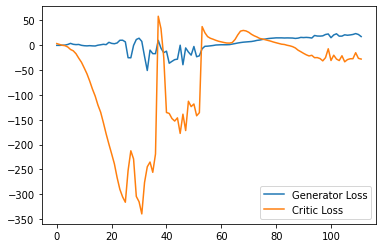

Step 2300: Generator loss: 25.09555654525757, critic loss: -22.376314173698425


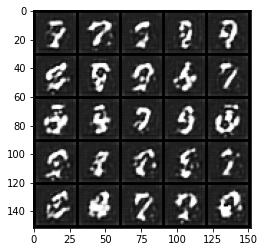

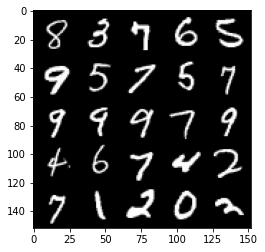

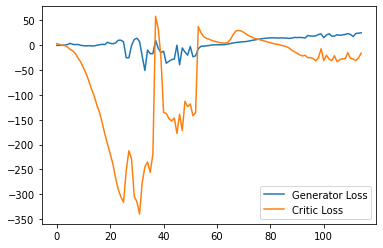

Step 2350: Generator loss: 23.365336723327637, critic loss: -18.07832848072052


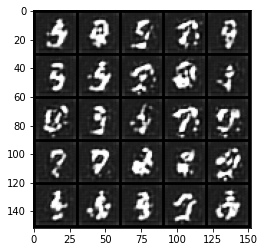

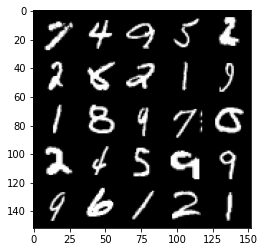

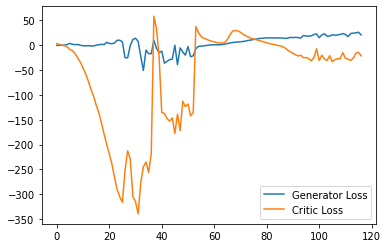

Step 2400: Generator loss: 28.71683078765869, critic loss: -5.2029255604743945


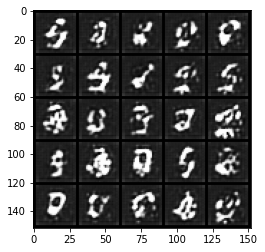

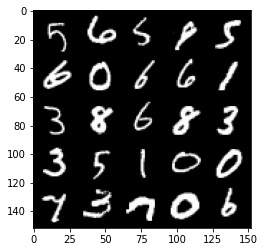

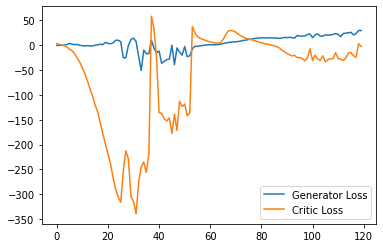

Step 2450: Generator loss: 26.954491958618163, critic loss: -1.9533883652687063


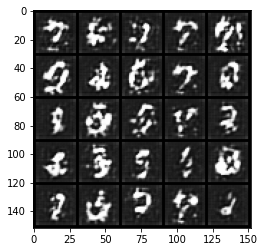

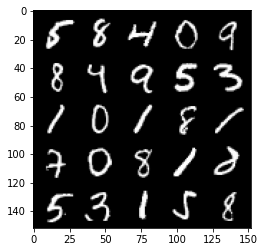

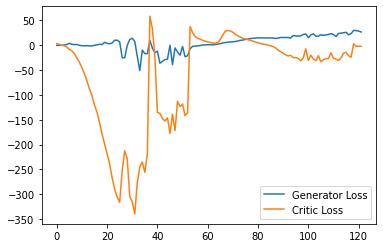

Step 2500: Generator loss: 22.049635696411134, critic loss: -2.4068814930915834


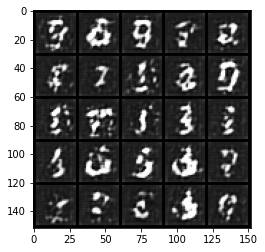

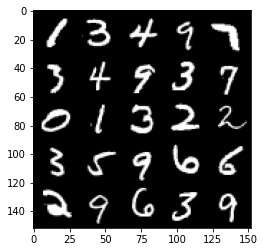

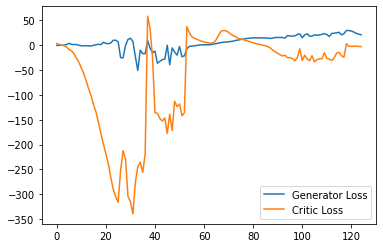

Step 2550: Generator loss: 16.489398536682128, critic loss: -12.734050691604613


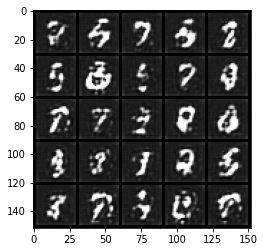

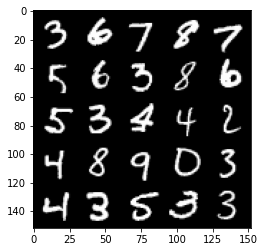

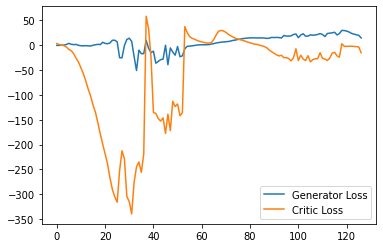

Step 2600: Generator loss: 14.35727536201477, critic loss: -18.410000095367433


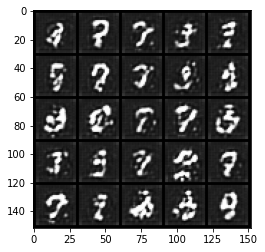

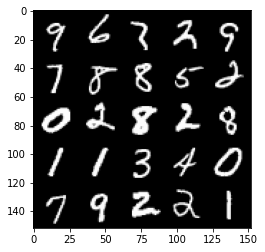

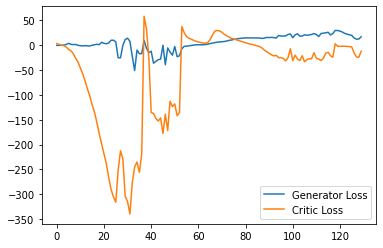

Step 2650: Generator loss: 24.216451873779295, critic loss: -2.773459543704986


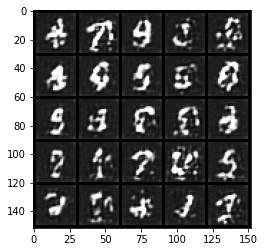

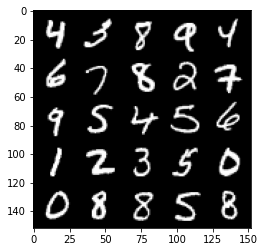

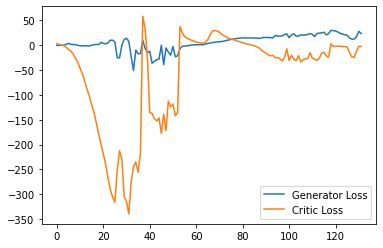

Step 2700: Generator loss: 15.507327709197998, critic loss: -15.256016195297239


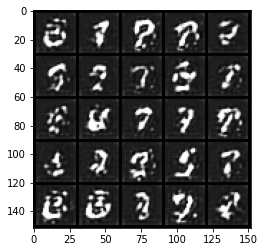

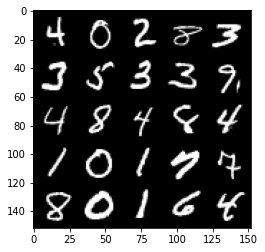

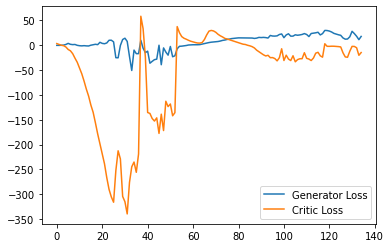

Step 2750: Generator loss: 16.95281421661377, critic loss: -21.8719507932663


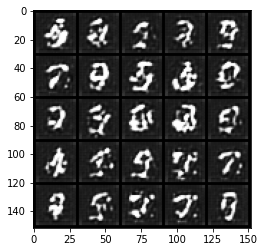

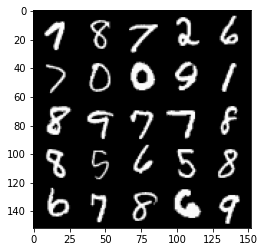

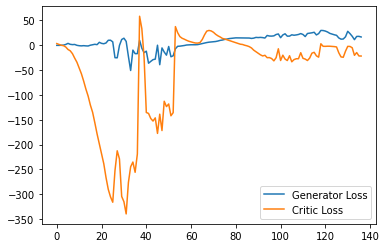

Step 2800: Generator loss: 20.050645372867585, critic loss: -20.348582996368407


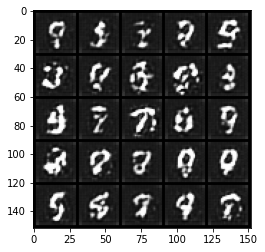

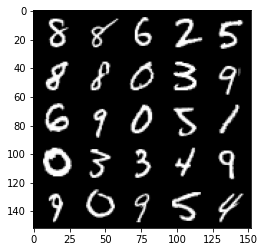

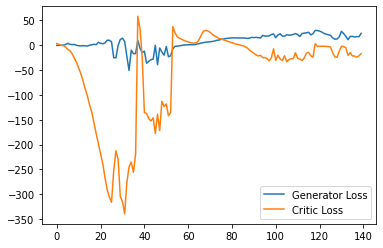

Step 2850: Generator loss: 20.195702388882637, critic loss: -17.381429853439332


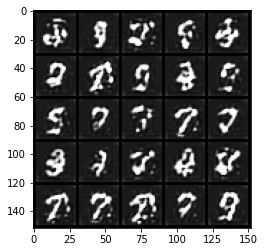

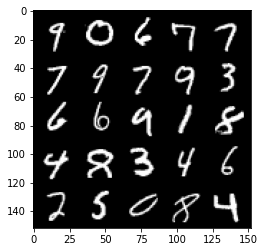

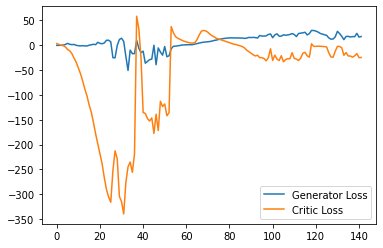

Step 2900: Generator loss: 29.377425689697265, critic loss: -3.4040211172103887


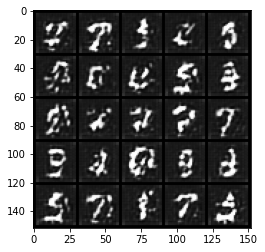

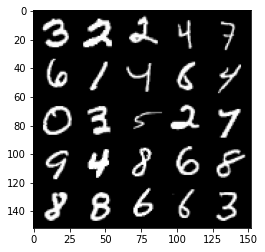

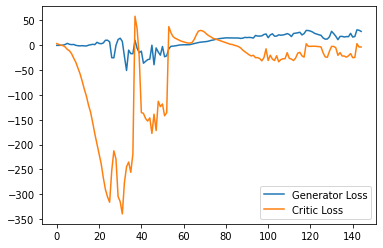

Step 2950: Generator loss: 21.273610210418703, critic loss: -8.623163043022155


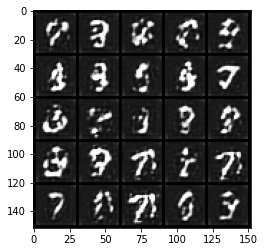

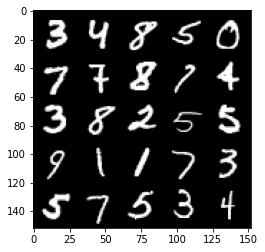

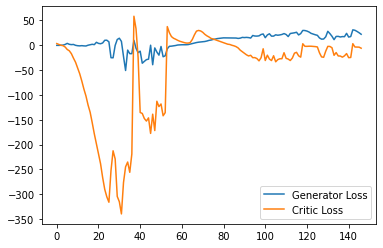

Step 3000: Generator loss: 14.941043047904968, critic loss: -21.535078993797296


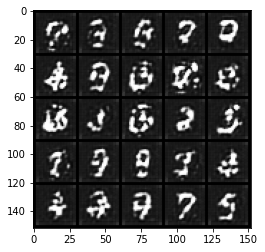

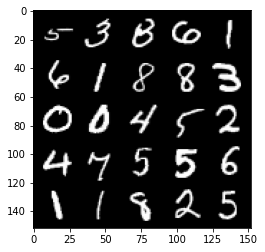

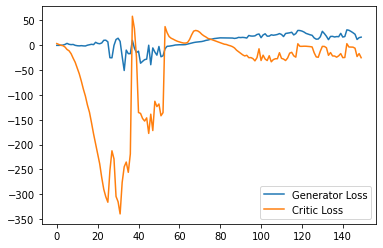

Step 3050: Generator loss: 14.7399711227417, critic loss: -23.62513234901428


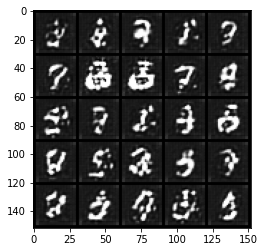

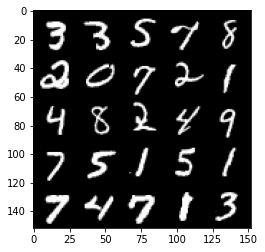

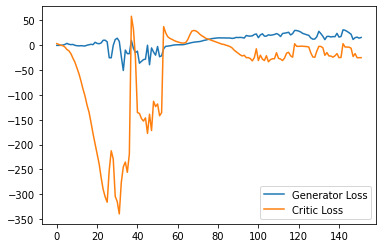

Step 3100: Generator loss: 19.375119047164915, critic loss: -21.521930871963495


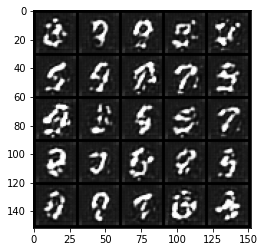

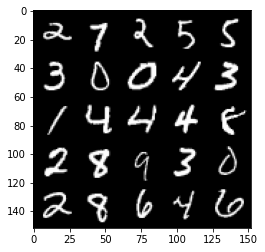

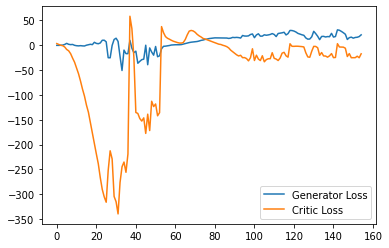

Step 3150: Generator loss: 21.72865671157837, critic loss: -21.06022757816315


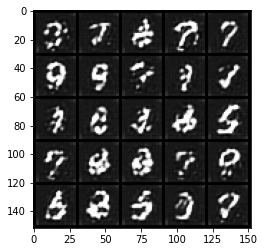

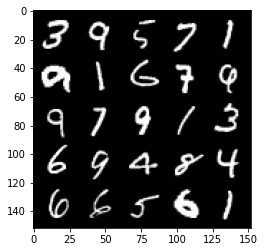

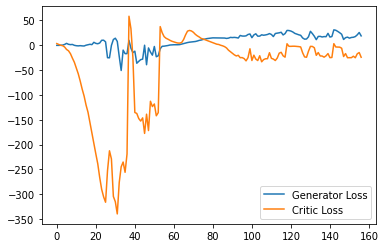

Step 3200: Generator loss: 19.05316421508789, critic loss: -23.145685997009288


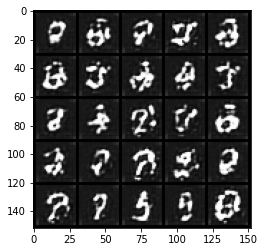

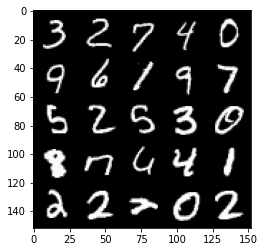

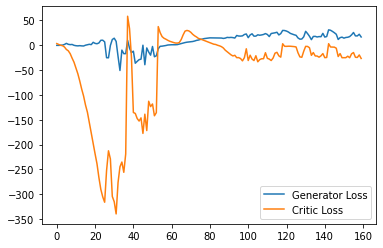

Step 3250: Generator loss: 22.430612659454347, critic loss: -22.365867036819466


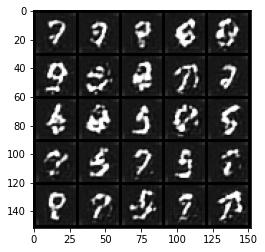

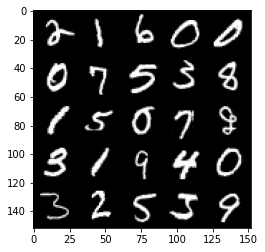

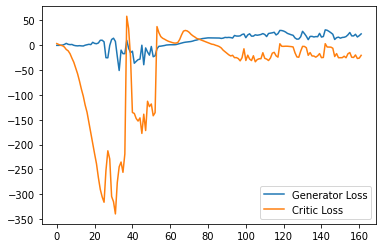

Step 3300: Generator loss: 21.9380317401886, critic loss: -16.539510857582098


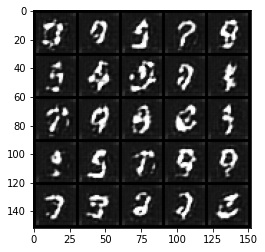

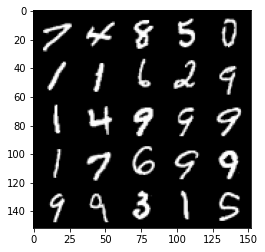

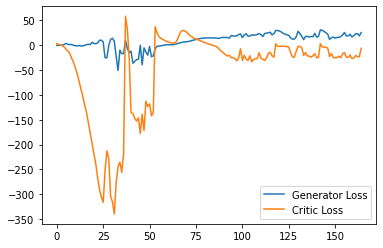

Step 3350: Generator loss: 26.84476683139801, critic loss: -7.920836903095243


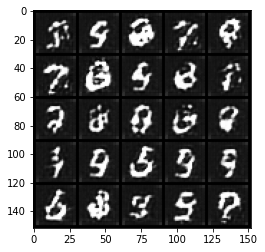

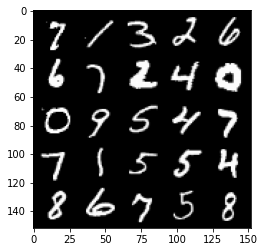

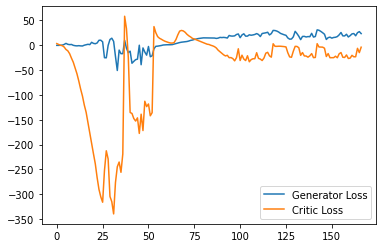

Step 3400: Generator loss: 29.669265823364256, critic loss: -3.6502833833694455


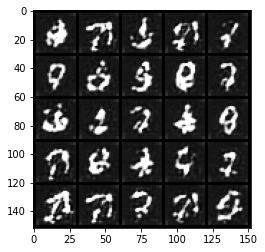

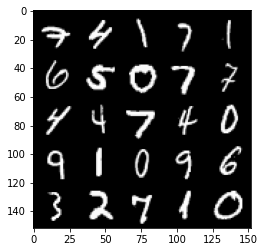

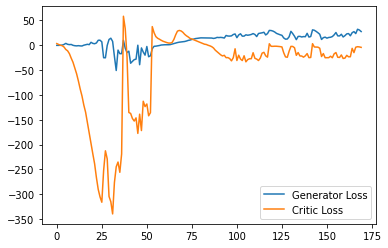

Step 3450: Generator loss: 15.113229990005493, critic loss: -21.933409757614132


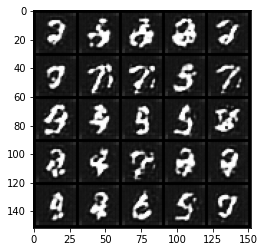

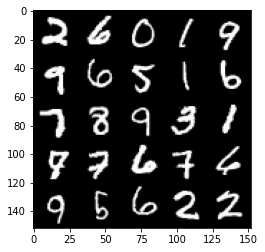

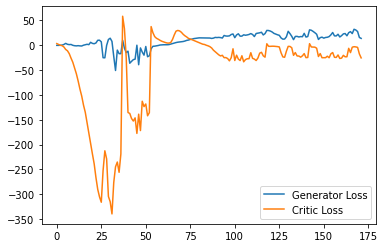

Step 3500: Generator loss: 21.30178153991699, critic loss: -17.475194602966315


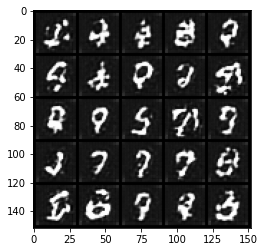

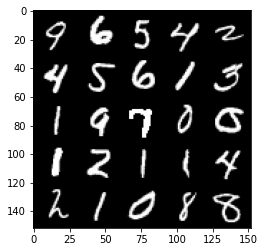

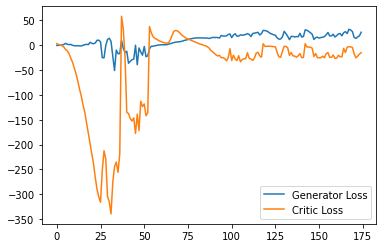

Step 3550: Generator loss: 20.292516918182372, critic loss: -19.58346037387848


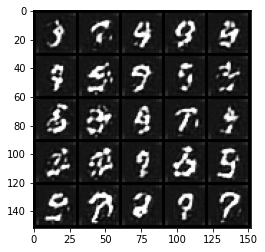

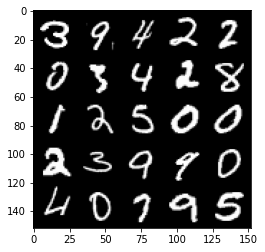

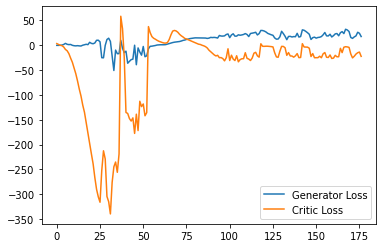

Step 3600: Generator loss: 18.515247416496276, critic loss: -24.784279037475596


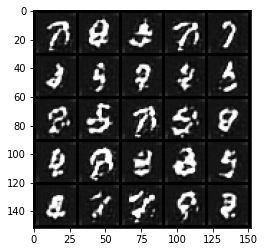

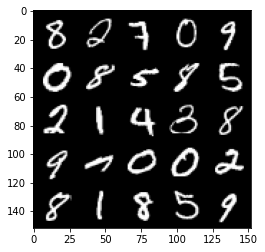

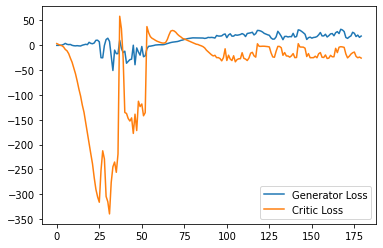

Step 3650: Generator loss: 18.385258326530458, critic loss: -22.487263586044325


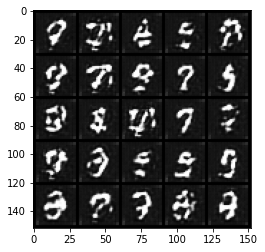

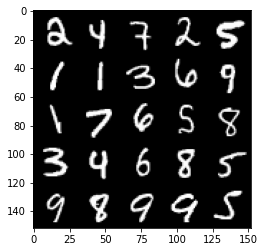

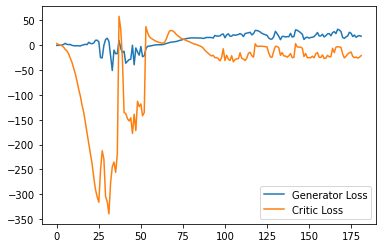

Step 3700: Generator loss: 20.036657848358153, critic loss: -22.893395895004268


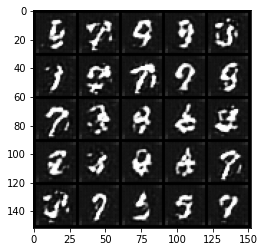

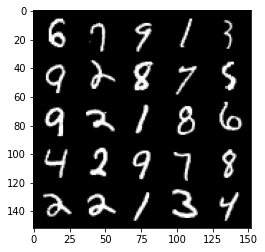

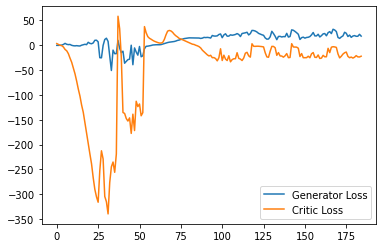

Step 3750: Generator loss: 29.76188486099243, critic loss: -5.319520079612733


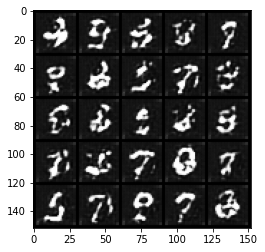

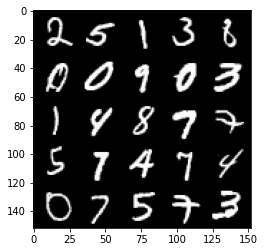

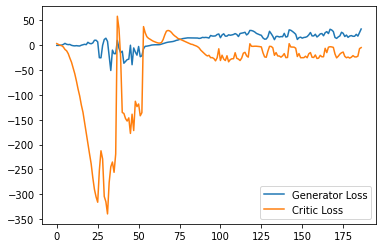

Step 3800: Generator loss: 21.00206192970276, critic loss: -18.669675786972046


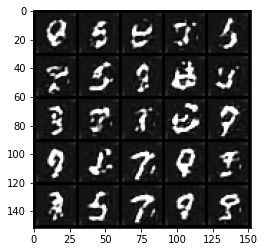

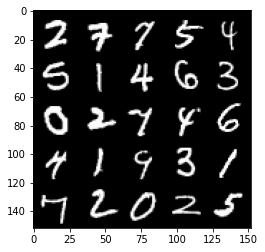

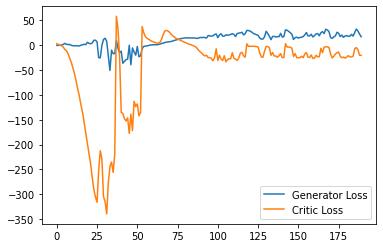

Step 3850: Generator loss: 24.465977554321288, critic loss: -12.82054766464234


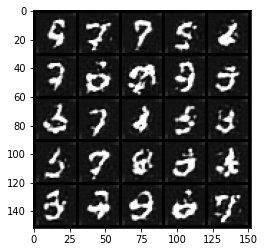

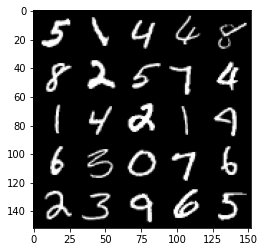

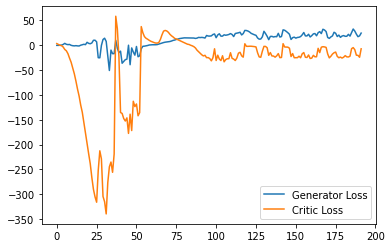

Step 3900: Generator loss: 30.63033790588379, critic loss: -3.544372116088868


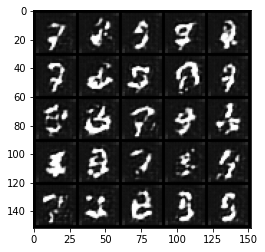

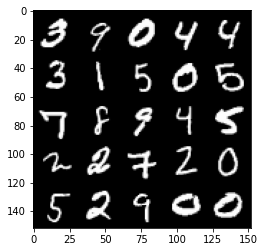

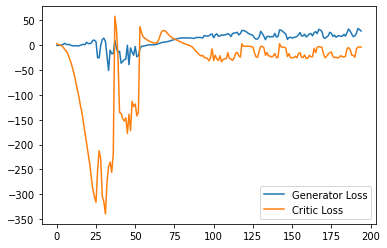

Step 3950: Generator loss: 24.2029323387146, critic loss: -5.891911118507384


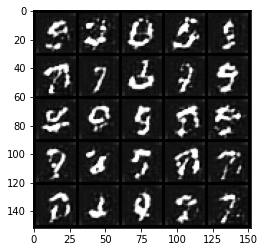

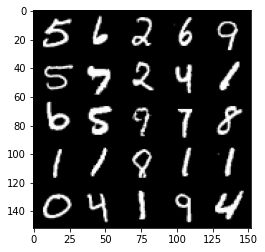

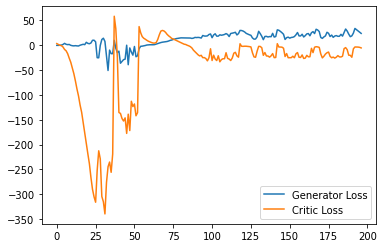

Step 4000: Generator loss: 18.672217273712157, critic loss: -11.074562578201292


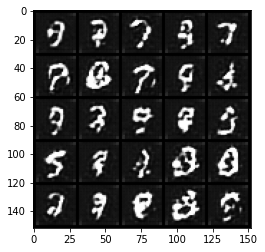

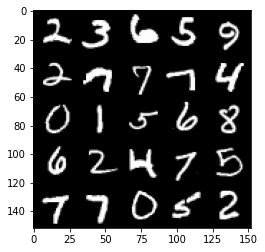

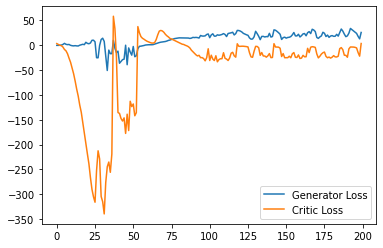

Step 4050: Generator loss: 31.586011085510254, critic loss: -2.961411045074463


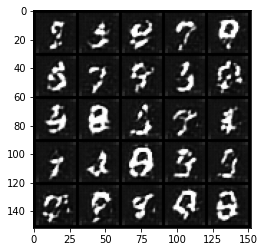

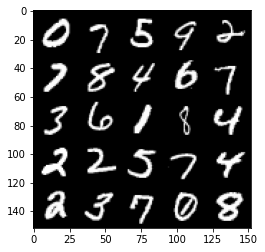

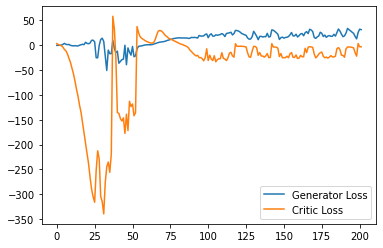

Step 4100: Generator loss: 28.53192413330078, critic loss: -2.889367980003357


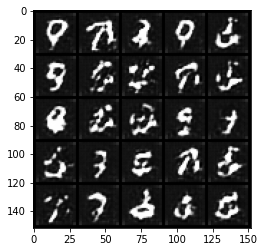

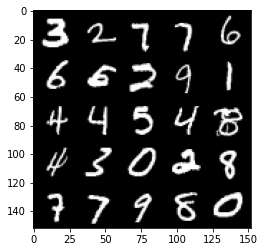

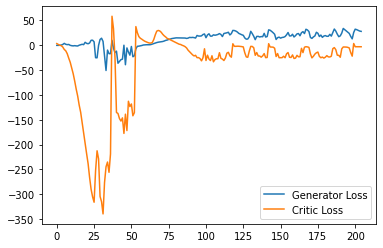

Step 4150: Generator loss: 27.107775459289552, critic loss: -3.3239895305633542


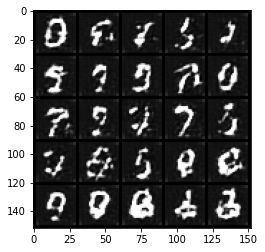

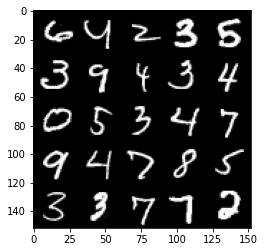

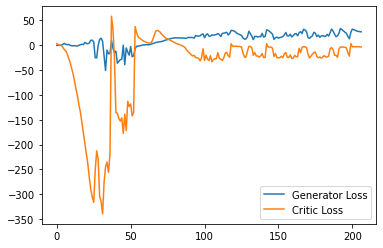

Step 4200: Generator loss: 24.525830726623536, critic loss: -4.9597147140502935


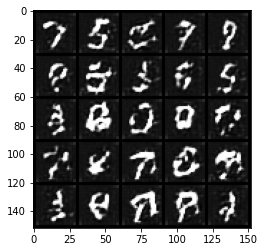

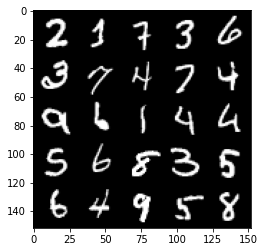

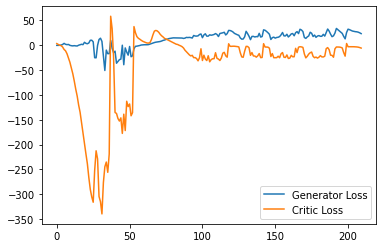

Step 4250: Generator loss: 23.161353917121886, critic loss: -5.846470148801802


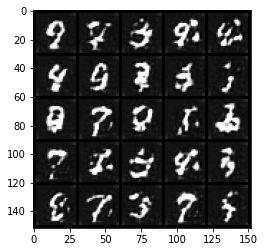

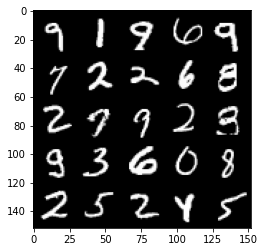

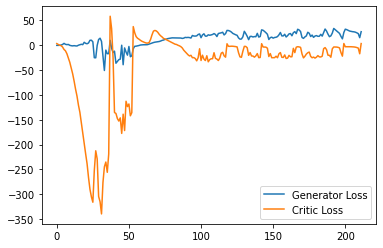

Step 4300: Generator loss: 28.14231357574463, critic loss: -3.053235193252563


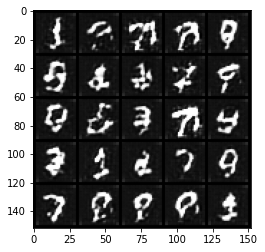

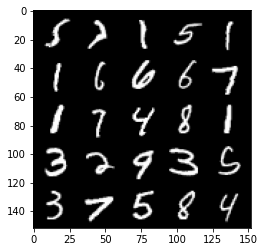

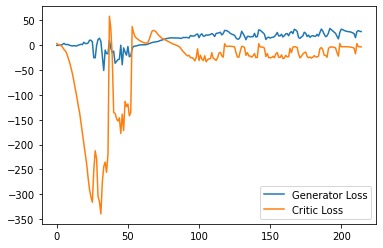

Step 4350: Generator loss: 23.54773504257202, critic loss: -6.1088901901245105


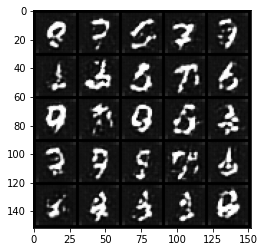

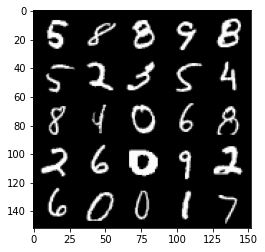

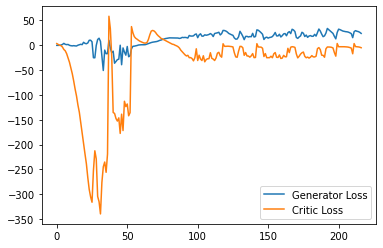

Step 4400: Generator loss: 21.4073473072052, critic loss: -10.551295714378357


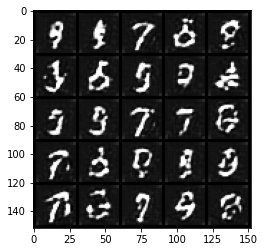

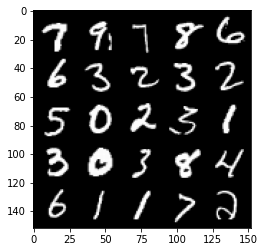

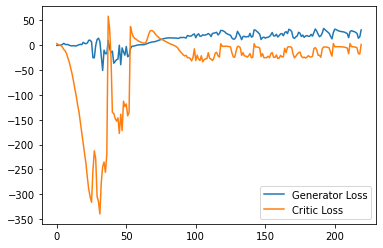

Step 4450: Generator loss: 30.235291290283204, critic loss: -4.254644107818603


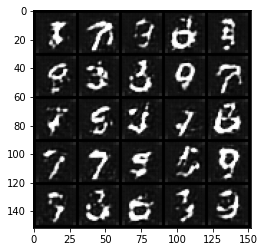

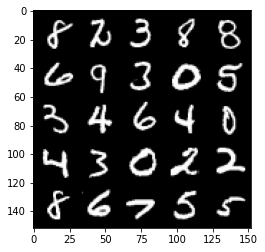

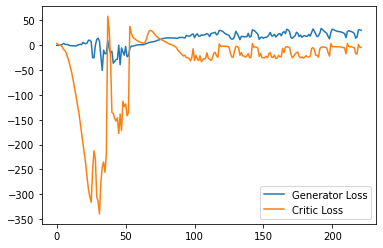

Step 4500: Generator loss: 20.24864496231079, critic loss: -16.05270557212829


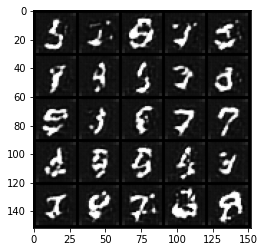

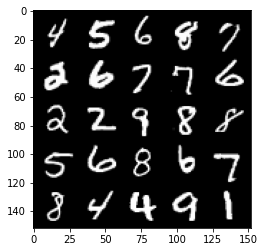

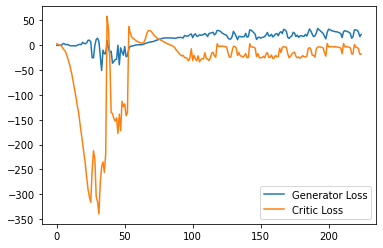

Step 4550: Generator loss: 15.081691989898681, critic loss: -22.18732571983337


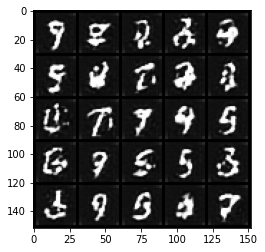

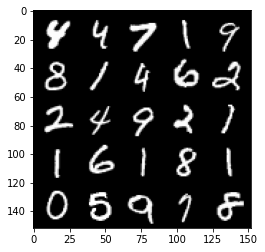

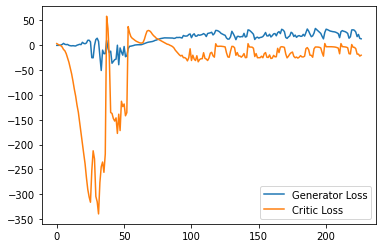

Step 4600: Generator loss: 19.530514278411864, critic loss: -22.82302160644531


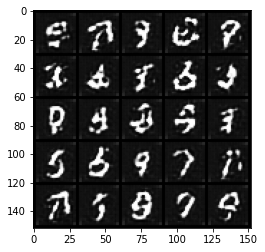

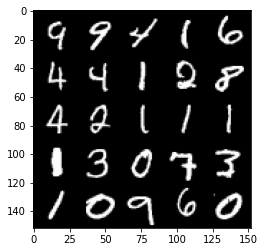

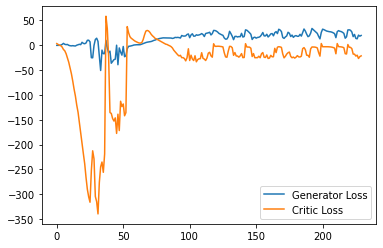

Step 4650: Generator loss: 21.434840919971467, critic loss: -18.42323202896118


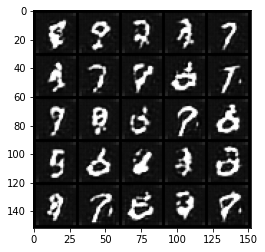

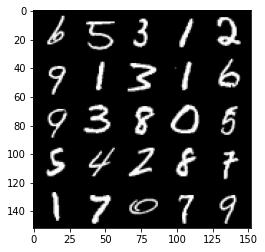

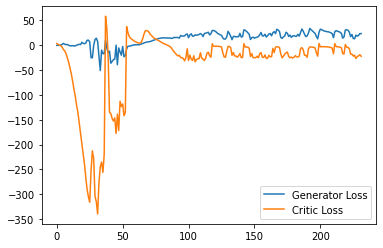

Step 4700: Generator loss: 32.52300527572632, critic loss: -8.857864863395692


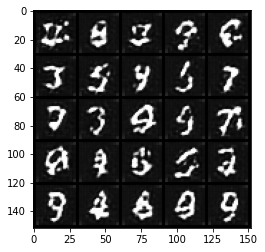

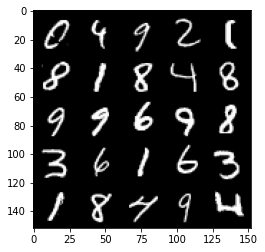

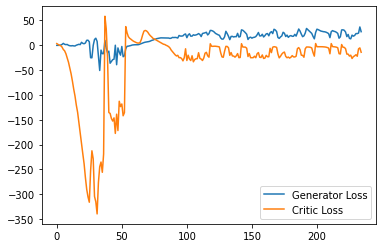

Step 4750: Generator loss: 22.82430519104004, critic loss: -17.85522111892701


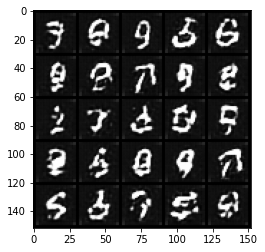

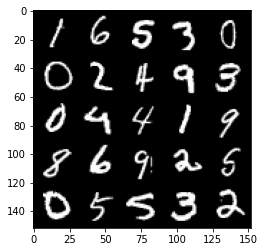

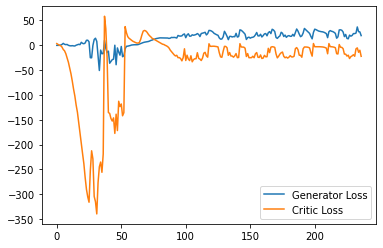

Step 4800: Generator loss: 24.554710035324096, critic loss: -20.297667779922484


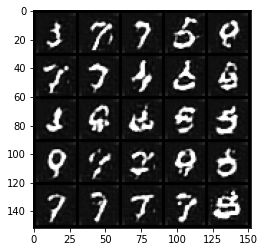

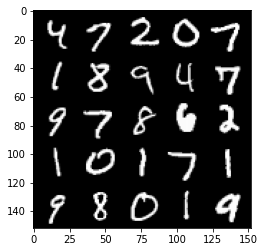

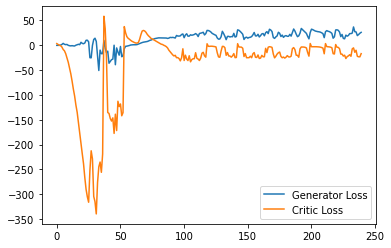

Step 4850: Generator loss: 25.41684949874878, critic loss: -22.94617704391479


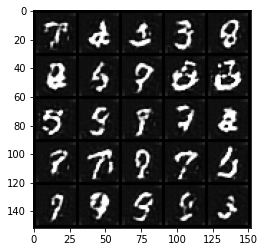

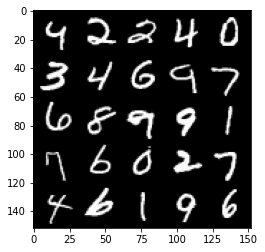

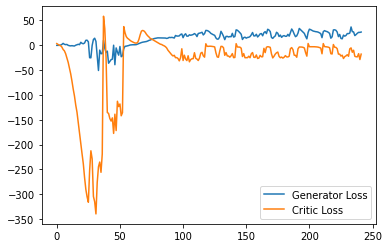

Step 4900: Generator loss: 37.06792519330978, critic loss: 1.2212140707969674


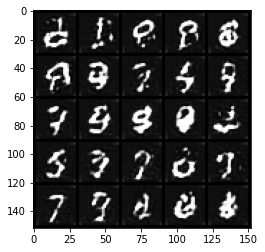

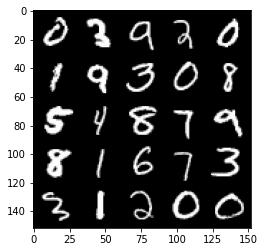

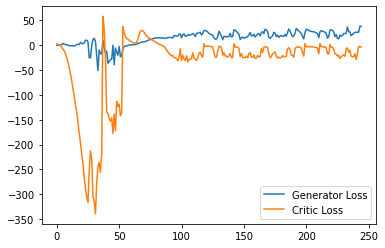

Step 4950: Generator loss: 34.891296005249025, critic loss: -3.352188024520874


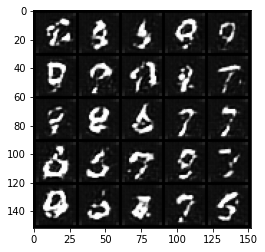

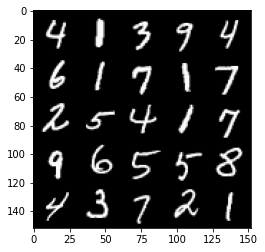

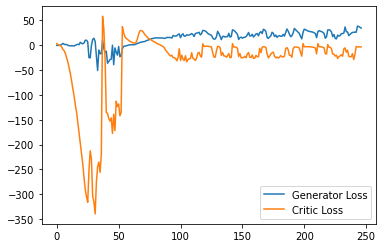

Step 5000: Generator loss: 31.551697006225584, critic loss: -4.08977408027649


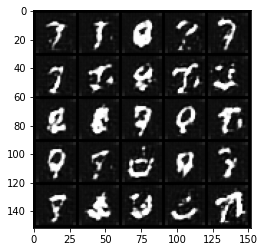

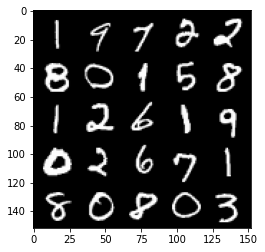

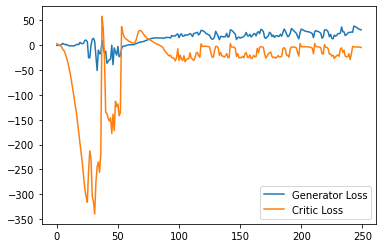

Step 5050: Generator loss: 23.158409180641176, critic loss: -13.685904903411863


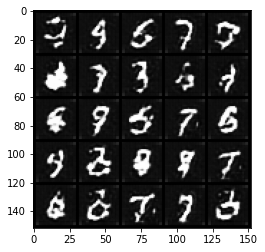

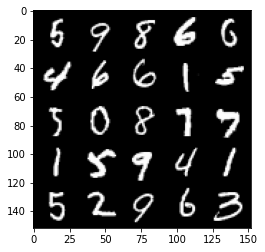

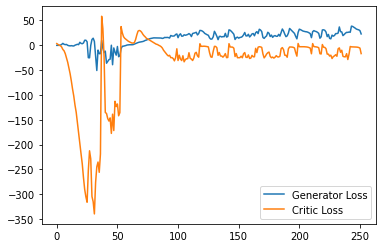

Step 5100: Generator loss: 34.819516315460206, critic loss: -1.7394044065475458


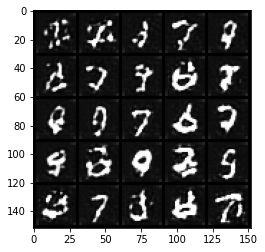

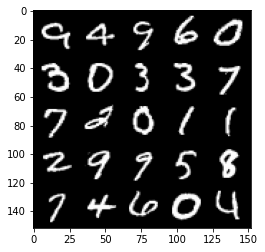

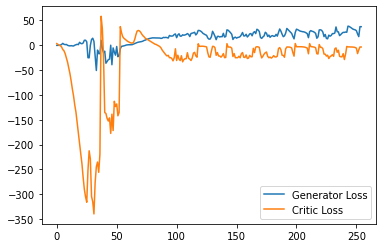

Step 5150: Generator loss: 35.02055671691895, critic loss: -3.8494772233963004


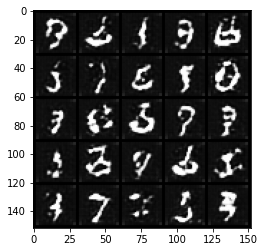

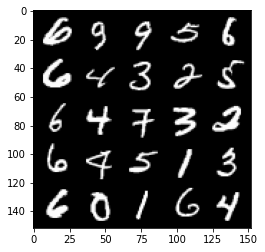

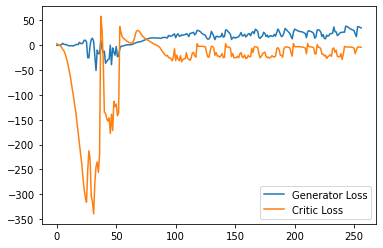

Step 5200: Generator loss: 24.995976963043212, critic loss: -10.977019670486447


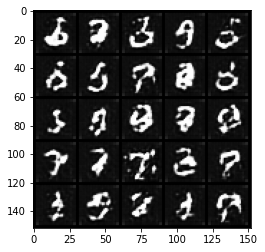

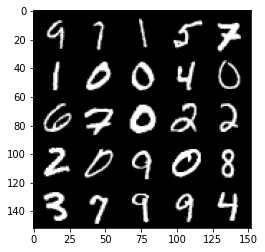

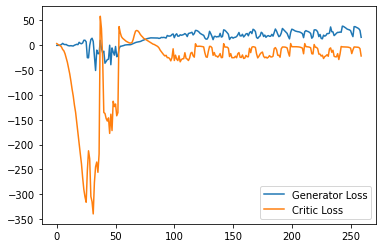

Step 5250: Generator loss: 30.91742033004761, critic loss: -9.215390558242797


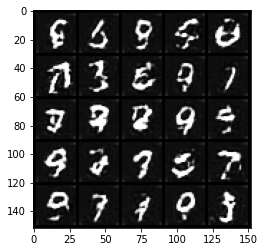

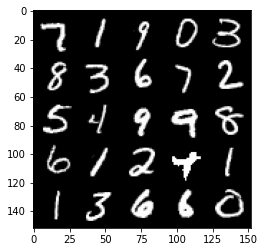

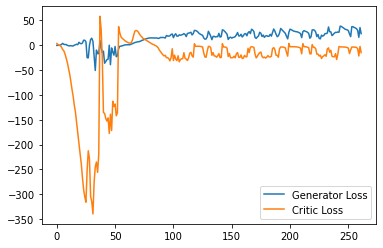

Step 5300: Generator loss: 25.040263290405274, critic loss: -17.3316159210205


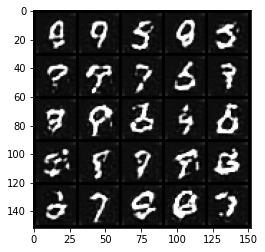

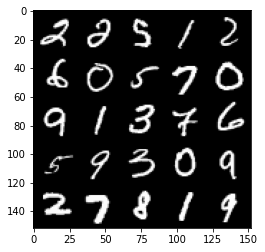

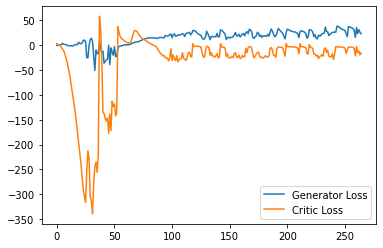

Step 5350: Generator loss: 38.68729835510254, critic loss: -4.29699097442627


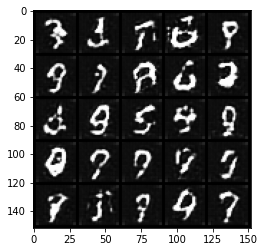

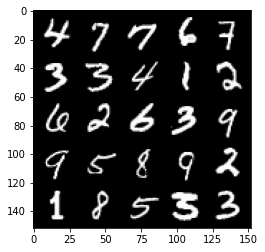

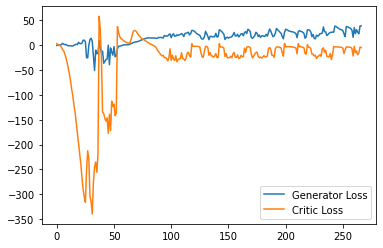

Step 5400: Generator loss: 25.460285205841064, critic loss: -18.08404267930984


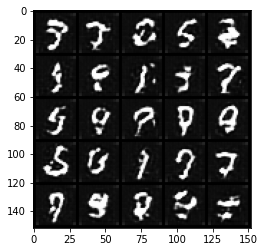

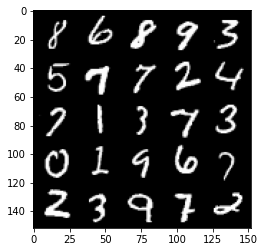

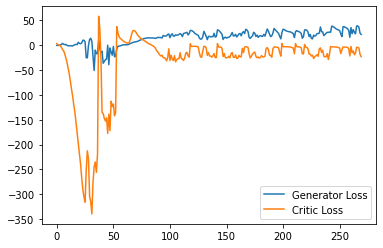

Step 5450: Generator loss: 26.660322017669678, critic loss: -22.626316332817083


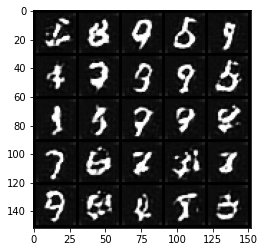

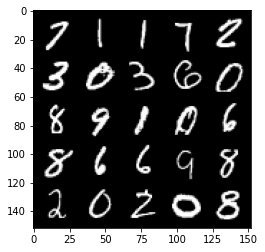

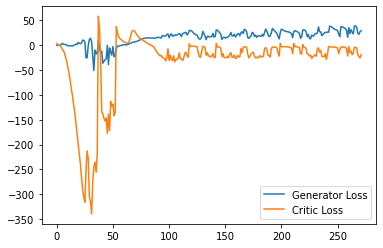

Step 5500: Generator loss: 34.76173299312592, critic loss: -4.390990587234497


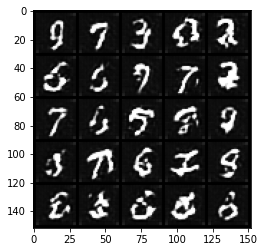

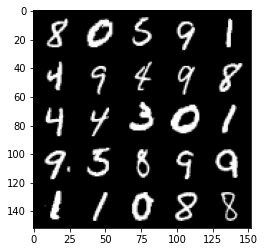

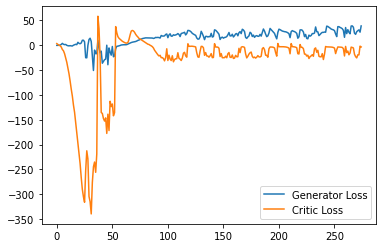

Step 5550: Generator loss: 38.13934562683105, critic loss: -3.876654489517213


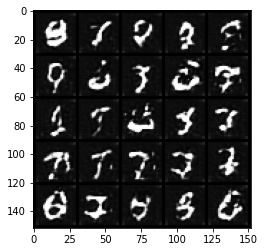

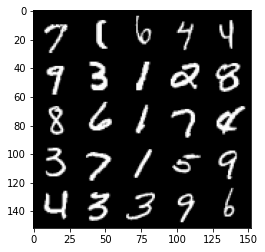

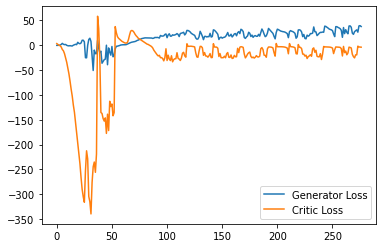

Step 5600: Generator loss: 26.228155851364136, critic loss: -14.831006195068358


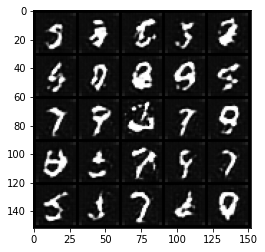

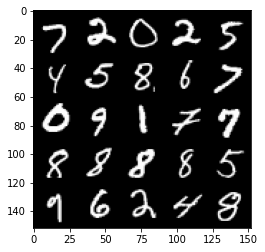

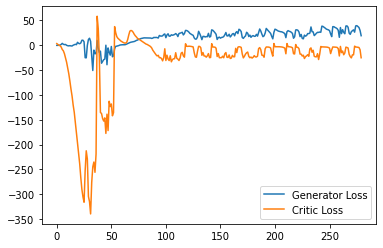

Step 5650: Generator loss: 33.615506439208986, critic loss: -1.4503565216064451


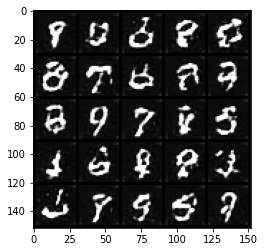

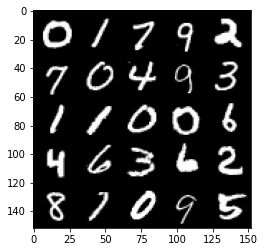

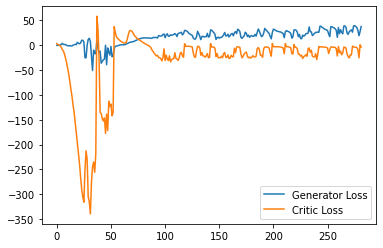

Step 5700: Generator loss: 31.12764419555664, critic loss: -7.052537267684937


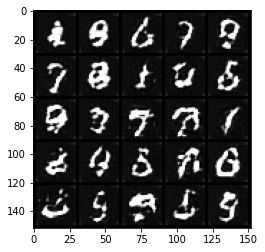

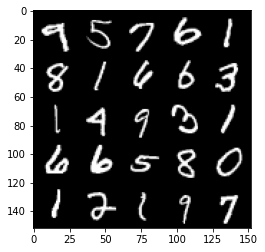

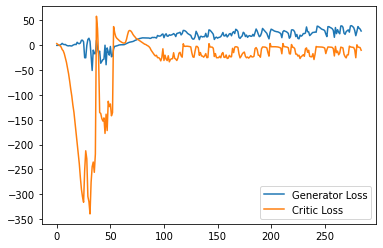

Step 5750: Generator loss: 20.418733367919923, critic loss: -20.12411542224884


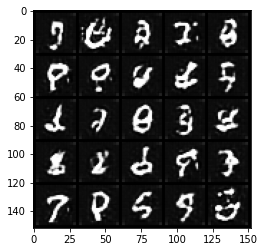

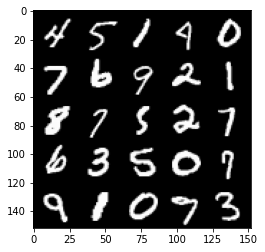

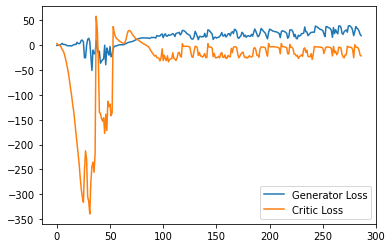

Step 5800: Generator loss: 30.03012586593628, critic loss: -11.684536705493926


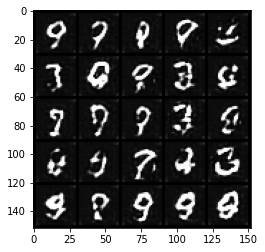

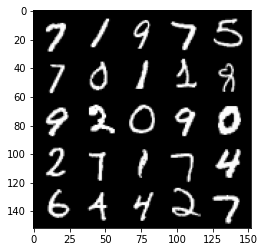

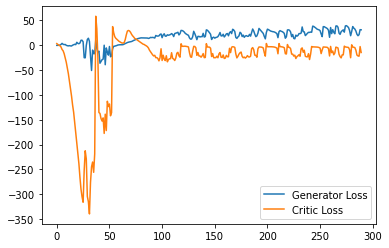

In [ ]:
import matplotlib.pyplot as plt

cur_step = 0
generator_losses = []
critic_losses = []
for epoch in range(n_epochs):
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)
        real = real.to(device)

        mean_iteration_critic_loss = 0
        for _ in range(crit_repeats):
            ### Update critic ###
            crit_opt.zero_grad()
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            crit_fake_pred = crit(fake.detach())
            crit_real_pred = crit(real)

            epsilon = torch.rand(len(real), 1, 1, 1, device=device, requires_grad=True)
            gradient = get_gradient(crit, real, fake.detach(), epsilon)
            gp = gradient_penalty(gradient)
            crit_loss = get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda)

            # Keep track of the average critic loss in this batch
            mean_iteration_critic_loss += crit_loss.item() / crit_repeats
            # Update gradients
            crit_loss.backward(retain_graph=True)
            # Update optimizer
            crit_opt.step()
        critic_losses += [mean_iteration_critic_loss]

        ### Update generator ###
        gen_opt.zero_grad()
        fake_noise_2 = get_noise(cur_batch_size, z_dim, device=device)
        fake_2 = gen(fake_noise_2)
        crit_fake_pred = crit(fake_2)
        
        gen_loss = get_gen_loss(crit_fake_pred)
        gen_loss.backward()

        # Update the weights
        gen_opt.step()

        # Keep track of the average generator loss
        generator_losses += [gen_loss.item()]

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            gen_mean = sum(generator_losses[-display_step:]) / display_step
            crit_mean = sum(critic_losses[-display_step:]) / display_step
            print(f"Step {cur_step}: Generator loss: {gen_mean}, critic loss: {crit_mean}")
            show_tensor_images(fake)
            show_tensor_images(real)
            step_bins = 20
            num_examples = (len(generator_losses) // step_bins) * step_bins
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(generator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Generator Loss"
            )
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(critic_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Critic Loss"
            )
            plt.legend()
            plt.show()

        cur_step += 1
